# Personal Loan Campaign - Problem Statement



Description
Background and Context

AllLife Bank is a US bank that has a growing customer base. The majority of these customers are liability customers (depositors) with varying sizes of deposits. The number of customers who are also borrowers (asset customers) is quite small, and the bank is interested in expanding this base rapidly to bring in more loan business and in the process, earn more through the interest on loans. In particular, the management wants to explore ways of converting its liability customers to personal loan customers (while retaining them as depositors).

A campaign that the bank ran last year for liability customers showed a healthy conversion rate of over 9% success. This has encouraged the retail marketing department to devise campaigns with better target marketing to increase the success ratio.

You as a Data scientist at AllLife bank have to build a model that will help the marketing department to identify the potential customers who have a higher probability of purchasing the loan.

Objective

To predict whether a liability customer will buy a personal loan or not.
Which variables are most significant.
Which segment of customers should be targeted more.
Data Dictionary
* ID: Customer ID
* Age: Customer’s age in completed years
* Experience: #years of professional experience
* Income: Annual income of the customer (in thousand dollars)
* ZIP Code: Home Address ZIP code.
* Family: the Family size of the customer
* CCAvg: Average spending on credit cards per month (in thousand dollars)
* Education: Education Level. 1: Undergrad; 2: Graduate;3: Advanced/Professional
* Mortgage: Value of house mortgage if any. (in thousand dollars)
* Personal_Loan: Did this customer accept the personal loan offered in the last campaign?
* Securities_Account: Does the customer have securities account with the bank?
* CD_Account: Does the customer have a certificate of deposit (CD) account with the bank?
* Online: Do customers use internet banking facilities?
* CreditCard: Does the customer use a credit card issued by any other Bank (excluding All life Bank)?



# Import Libraries for the notebook 

In [1]:
import pandas as pd
import numpy as np
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    plot_confusion_matrix,
    precision_recall_curve,
    roc_curve,
)

In [2]:
url = "Loan_Modelling.csv"
#load csv with pandas librabry and see the preview
plData = pd.read_csv(url)

plData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ID                  5000 non-null   int64  
 1   Age                 5000 non-null   int64  
 2   Experience          5000 non-null   int64  
 3   Income              5000 non-null   int64  
 4   ZIPCode             5000 non-null   int64  
 5   Family              5000 non-null   int64  
 6   CCAvg               5000 non-null   float64
 7   Education           5000 non-null   int64  
 8   Mortgage            5000 non-null   int64  
 9   Personal_Loan       5000 non-null   int64  
 10  Securities_Account  5000 non-null   int64  
 11  CD_Account          5000 non-null   int64  
 12  Online              5000 non-null   int64  
 13  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 547.0 KB


In [3]:
#shape of the dataset.

plData.shape


(5000, 14)

In [4]:
# explore the dataset more to see whats going on 

#Create a function to do value counts on each column 

def printValueCounts(df):
  for col in df.columns:
    print("---- %s ---")
    print(df[col].value_counts())
    
printValueCounts(plData)

#plData.value_counts()

---- %s ---
2049    1
1210    1
3271    1
1222    1
3267    1
       ..
2604    1
4651    1
553     1
2600    1
2047    1
Name: ID, Length: 5000, dtype: int64
---- %s ---
35    151
43    149
52    145
58    143
54    143
50    138
41    136
30    136
56    135
34    134
39    133
57    132
59    132
51    129
60    127
45    127
46    127
42    126
31    125
40    125
55    125
29    123
62    123
61    122
44    121
33    120
32    120
48    118
49    115
38    115
47    113
53    112
63    108
36    107
37    106
28    103
27     91
65     80
64     78
26     78
25     53
24     28
66     24
23     12
67     12
Name: Age, dtype: int64
---- %s ---
 32    154
 20    148
 9     147
 5     146
 23    144
 35    143
 25    142
 28    138
 18    137
 19    135
 26    134
 24    131
 3     129
 14    127
 16    127
 30    126
 34    125
 27    125
 17    125
 22    124
 29    124
 7     121
 15    119
 8     119
 6     119
 10    118
 33    117
 13    117
 11    116
 37    116
 36    114
 4

In [5]:
plData.isnull().values.any() # If there are any null values in data set

False

In [6]:
plData.isnull().values.any() # If there are any null values in data set

False

# Identify Correlation in data

In [7]:
plData.corr() # It will show correlation matrix 

,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
ID,1.000000,-0.008473,-0.008326,-0.017695,0.002240,-0.016797,-0.024675,0.021463,-0.013920,-0.024801,-0.016972,-0.006909,-0.002528,0.017028
Age,-0.008473,1.000000,0.994215,-0.055269,-0.030530,-0.046418,-0.052012,0.041334,-0.012539,-0.007726,-0.000436,0.008043,0.013702,0.007681
Experience,-0.008326,0.994215,1.000000,-0.046574,-0.030456,-0.052563,-0.050077,0.013152,-0.010582,-0.007413,-0.001232,0.010353,0.013898,0.008967
Income,-0.017695,-0.055269,-0.046574,1.000000,-0.030709,-0.157501,0.645984,-0.187524,0.206806,0.502462,-0.002616,0.169738,0.014206,-0.002385
ZIPCode,0.002240,-0.030530,-0.030456,-0.030709,1.000000,0.027512,-0.012188,-0.008266,0.003614,-0.002974,0.002422,0.021671,0.028317,0.024033
Family,-0.016797,-0.046418,-0.052563,-0.157501,0.027512,1.000000,-0.109275,0.064929,-0.020445,0.061367,0.019994,0.014110,0.010354,0.011588
CCAvg,-0.024675,-0.052012,-0.050077,0.645984,-0.012188,-0.109275,1.000000,-0.136124,0.109905,0.366889,0.015086,0.136534,-0.003611,-0.006689
Education,0.021463,0.041334,0.013152,-0.187524,-0.008266,0.064929,-0.136124,1.000000,-0.033327,0.136722,-0.010812,0.013934,-0.015004,-0.011014
Mortgage,-0.013920,-0.012539,-0.010582,0.206806,0.003614,-0.020445,0.109905,-0.033327,1.000000,0.142095,-0.005411,0.089311,-0.005995,-0.007231
Personal_Loan,-0.024801,-0.007726,-0.007413,0.502462,-0.002974,0.061367,0.366889,0.136722,0.142095,1.000000,0.021954,0.316355,0.006278,0.002802


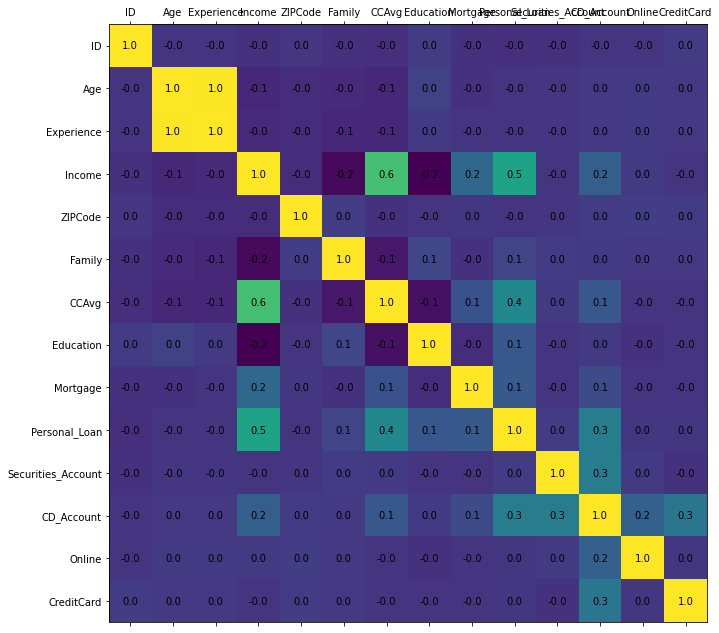

In [8]:
# However we want to see correlation in graphical representation so below is function for that
def plot_corr(df, size=11):
    corr = df.corr()
    fig, ax = plt.subplots(figsize=(size, size))
    ax.matshow(corr)
    plt.xticks(range(len(corr.columns)), corr.columns)
    plt.yticks(range(len(corr.columns)), corr.columns)
    for (i, j), z in np.ndenumerate(corr):
        ax.text(j, i, '{:0.1f}'.format(z), ha='center', va='center')
        
plot_corr(plData)

In [9]:
from pandas_profiling import ProfileReport
ProfileReport(plData)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#  EDA with custom functions 
### UniVariant analysis
    . This involves only one variable in the dataset and we can bring in insights from it

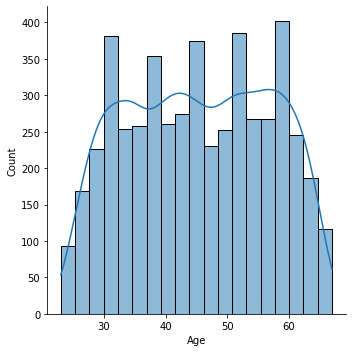

In [10]:
# dist plot with histogram chart

sns.displot(plData, x="Age", kde=True)
plt.style.use('default')






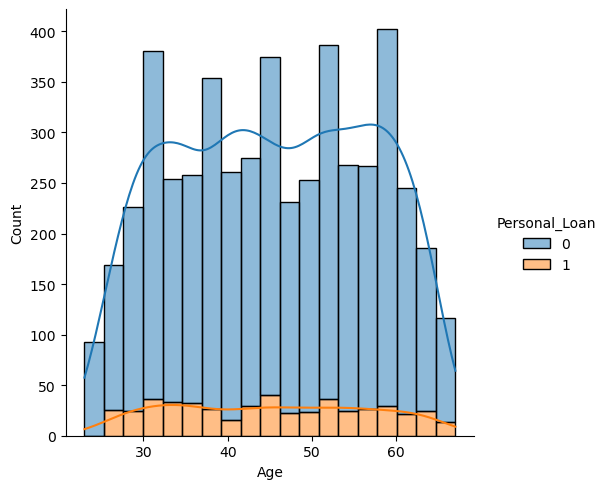

In [11]:
sns.displot(data=plData, x="Age", hue="Personal_Loan", multiple="stack",kde=True)


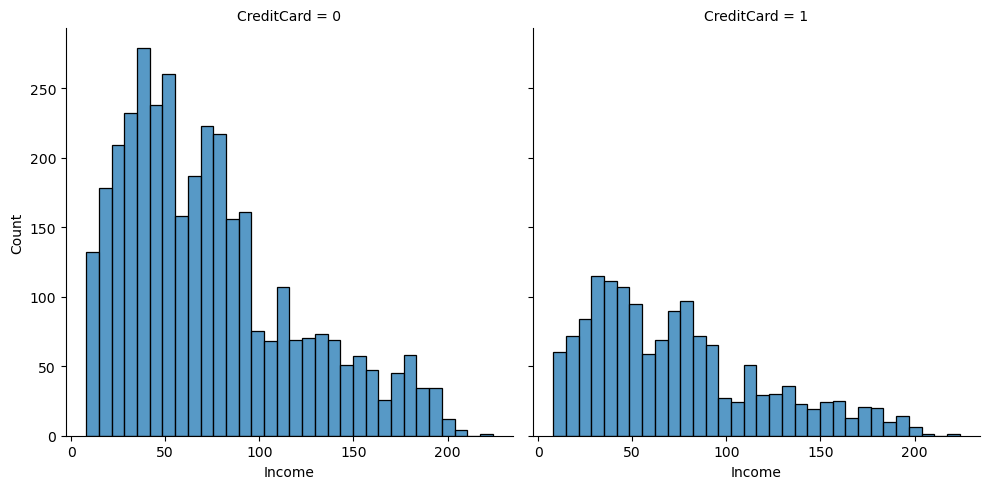

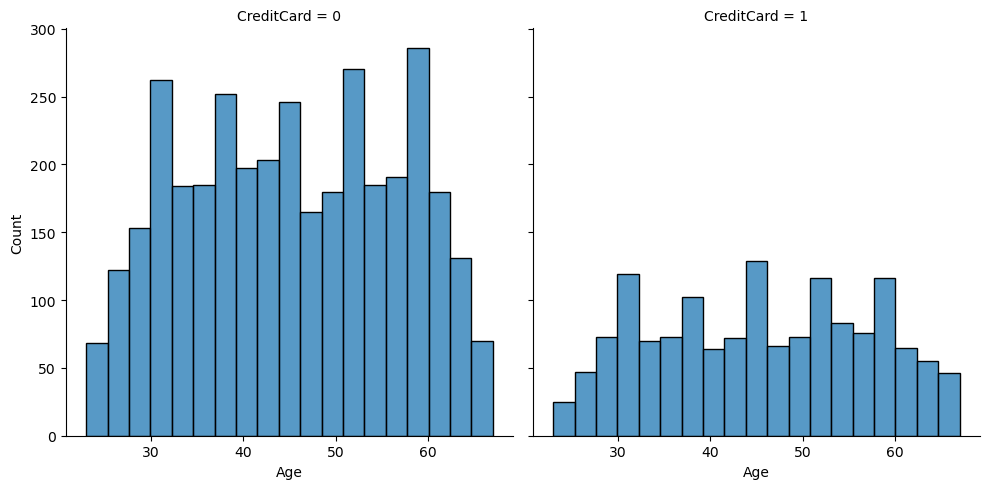

In [12]:

sns.displot(plData, x="Income", col="CreditCard")
sns.displot(plData, x="Age", col="CreditCard")



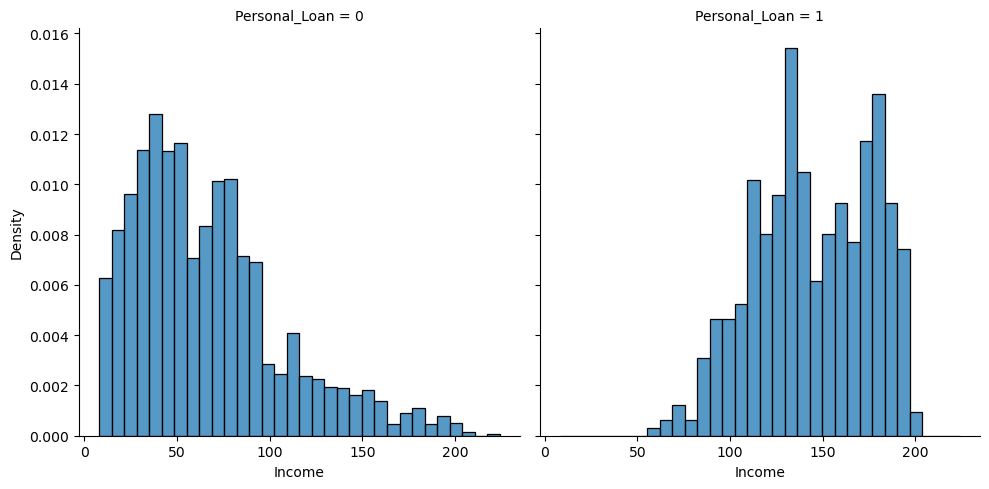

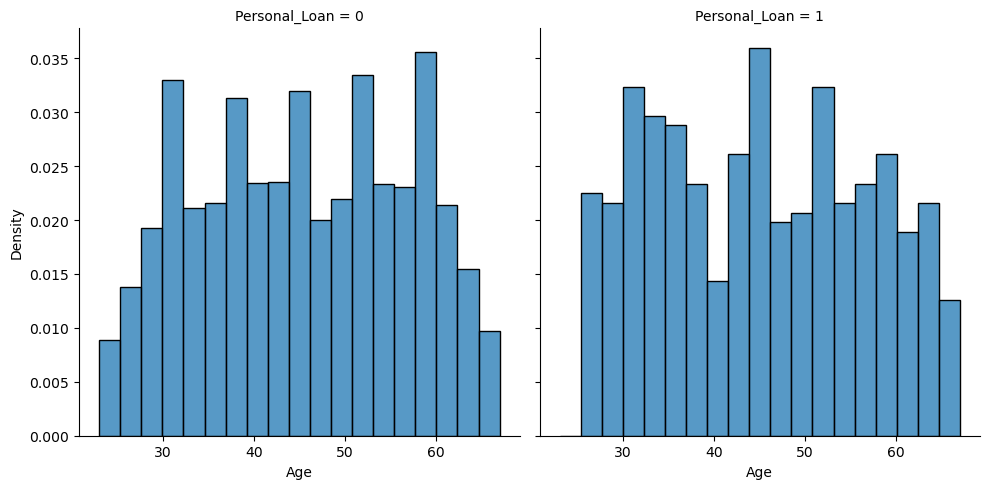

In [13]:
sns.displot(plData, x="Income", col="Personal_Loan",stat="density",common_norm=False)
sns.displot(plData, x="Age", col="Personal_Loan",stat="density",common_norm=False)

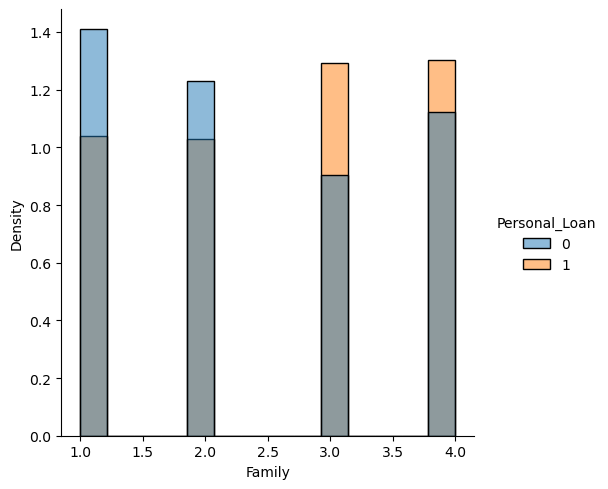

In [14]:
sns.displot(plData, x="Family", hue="Personal_Loan", stat="density",common_norm=False)


<AxesSubplot:ylabel='count'>

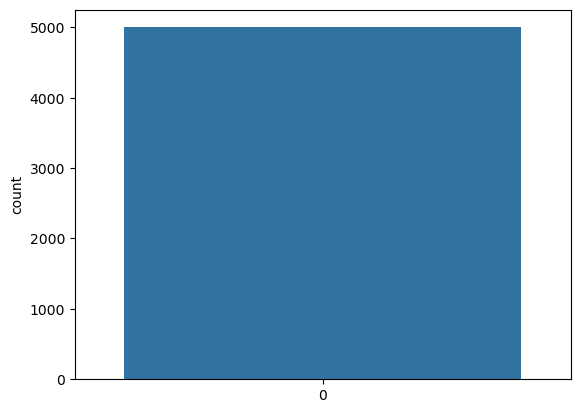

In [15]:
sns.countplot(data = plData['Family'])

<AxesSubplot:xlabel='Family', ylabel='Age'>

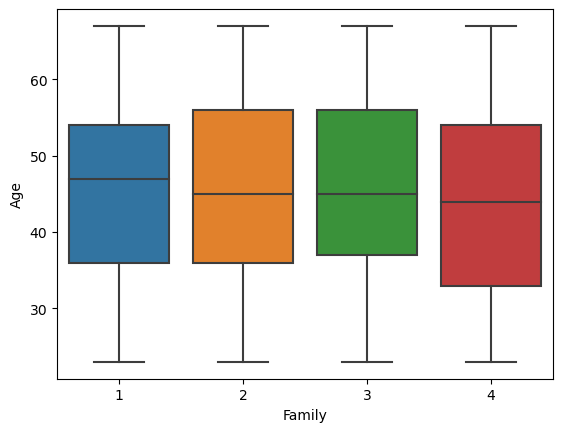

In [16]:
sns.boxplot(x = "Family", y = "Age", data=plData)


In [17]:
#let us find out people who are already owning all different kinds of loans
loanTakers = plData.copy()
loanTakers = loanTakers[(loanTakers.CreditCard == 1) & (loanTakers.Personal_Loan == 1)]
loanTakersMortageIncluded = loanTakers.copy()
loanTakersMortageIncluded = loanTakersMortageIncluded[loanTakersMortageIncluded.Mortgage >0]

print(loanTakers.shape)
print(loanTakers.head())
print('-----------------------------------------------')
print(loanTakersMortageIncluded.shape)
loanTakersMortageIncluded.head()


(143, 14)
      ID  Age  Experience  Income  ZIPCode  Family  CCAvg  Education  \
29    30   38          13     119    94104       1    3.3          2   
47    48   37          12     194    91380       4    0.2          3   
75    76   31           7     135    94901       4    3.8          2   
131  132   58          34     149    93720       4    7.2          2   
151  152   26           0     132    92834       3    6.5          3   

     Mortgage  Personal_Loan  Securities_Account  CD_Account  Online  \
29          0              1                   0           1       1   
47        211              1                   1           1       1   
75          0              1                   0           1       1   
131         0              1                   0           1       1   
151         0              1                   0           0       0   

     CreditCard  
29            1  
47            1  
75            1  
131           1  
151           1  
----------------

,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
47,48,37,12,194,91380,4,0.2,3,211,1,1,1,1,1
209,210,64,39,172,94707,4,3.1,1,282,1,0,1,1,1
438,439,58,32,113,93943,2,3.8,2,119,1,0,1,1,1
782,783,54,30,194,92056,3,6.0,3,587,1,1,1,1,1
891,892,32,6,120,94102,4,5.4,1,301,1,0,1,1,1


# Observations
### the density of customers age is  a reflection of people using banking applicatons in most income earning pahse of life
###  30 - 55 age customers  are highest in number with the bank
###   We got more than 53 accounts who have mortage, personal loan and also a credit card, these accounts need
###   more analysis to see if we can give another loan based on income and mortage situation.
###  We can exclude these from marketting for new loan as it could be bad loan

In [18]:
#get people who has mortage more than income 
mortageRiskLenders = plData.copy()
print(mortageRiskLenders.shape)
mortageRiskLenders = mortageRiskLenders[mortageRiskLenders.Mortgage > mortageRiskLenders.Income]
print('checking how many such rows of data are present')
print(mortageRiskLenders.shape)
mortageRiskLenders.head()

(5000, 14)
checking how many such rows of data are present
(1460, 14)


,ID,Age,Experience,Income,ZIPCode,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
5,6,37,13,29,92121,4,0.4,2,155,0,0,0,1,0
8,9,35,10,81,90089,3,0.6,2,104,0,0,0,1,0
16,17,38,14,130,95010,4,4.7,3,134,1,0,0,0,0
20,21,56,31,25,94015,4,0.9,2,111,0,0,0,1,0
22,23,29,5,62,90277,1,1.2,1,260,0,0,0,1,0


# we try to understand the family position in terms of mortgage 

<AxesSubplot:xlabel='Family', ylabel='Mortgage'>

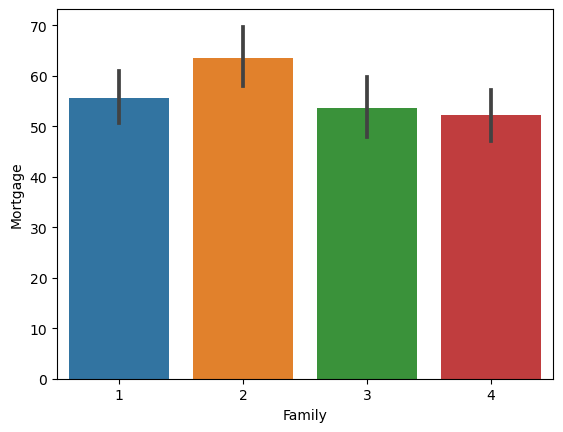

In [19]:
sns.barplot(data=plData, x="Family", y="Mortgage" )


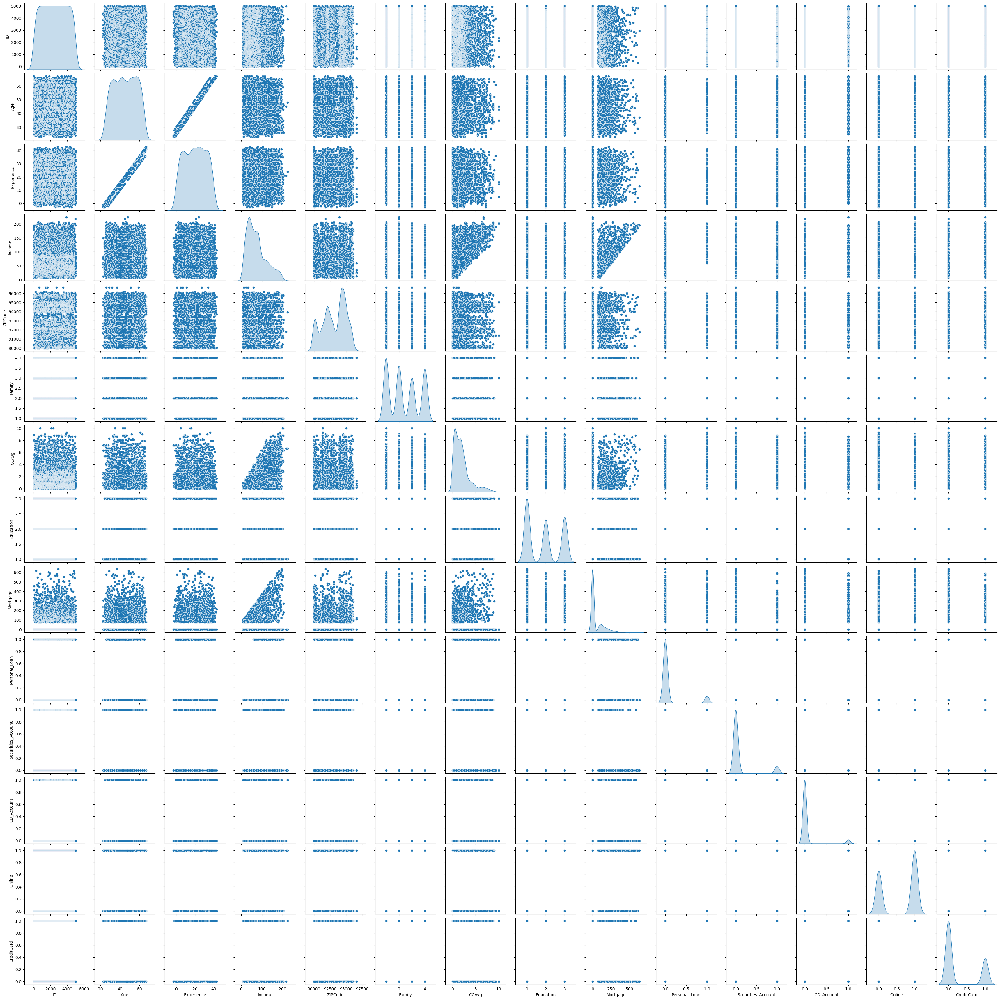

In [20]:
sns.pairplot(plData,diag_kind='kde')

# data overview check for duplicates in the dataset

In [21]:
plData.duplicated().sum()  # checking for duplicate data in dataframe

0

In [22]:
# Removing column ID as it does not make any meaning to predict or process data
plData.drop(["ID"], axis=1, inplace=True)
plData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 5000 non-null   int64  
 1   Experience          5000 non-null   int64  
 2   Income              5000 non-null   int64  
 3   ZIPCode             5000 non-null   int64  
 4   Family              5000 non-null   int64  
 5   CCAvg               5000 non-null   float64
 6   Education           5000 non-null   int64  
 7   Mortgage            5000 non-null   int64  
 8   Personal_Loan       5000 non-null   int64  
 9   Securities_Account  5000 non-null   int64  
 10  CD_Account          5000 non-null   int64  
 11  Online              5000 non-null   int64  
 12  CreditCard          5000 non-null   int64  
dtypes: float64(1), int64(12)
memory usage: 507.9 KB


In [23]:
# While doing univariate analysis of numerical variables we want to study their central tendency and dispersion.
# Let us write a function that will help us create a boxplot and a histogram for any input numerical variable.
# This function takes the numerical column as the input and returns the boxplots and histograms for the variable.
# Let us see if this helps us write faster and cleaner code.


def univariate_num_plot(feature, figsize=(10, 8), bins=10):
    """Boxplot and histogram combined
    feature: 1-d feature array
    figsize: size of fig (default (9,8))
    bins: number of bins (default None / auto)
    """
    print(feature.describe())
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        x=feature, ax=ax_box2, showmeans=True
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        x=feature, kde=False, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        x=feature, kde=False, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        feature.mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        feature.median(), color="black", linestyle="-"
    )  # Add median to the histogram

count    5000.000000
mean       45.338400
std        11.463166
min        23.000000
25%        35.000000
50%        45.000000
75%        55.000000
max        67.000000
Name: Age, dtype: float64
count    5000.000000
mean       20.104600
std        11.467954
min        -3.000000
25%        10.000000
50%        20.000000
75%        30.000000
max        43.000000
Name: Experience, dtype: float64
count    5000.000000
mean       73.774200
std        46.033729
min         8.000000
25%        39.000000
50%        64.000000
75%        98.000000
max       224.000000
Name: Income, dtype: float64
count     5000.000000
mean     93169.257000
std       1759.455086
min      90005.000000
25%      91911.000000
50%      93437.000000
75%      94608.000000
max      96651.000000
Name: ZIPCode, dtype: float64
count    5000.000000
mean        2.396400
std         1.147663
min         1.000000
25%         1.000000
50%         2.000000
75%         3.000000
max         4.000000
Name: Family, dtype: float64
count

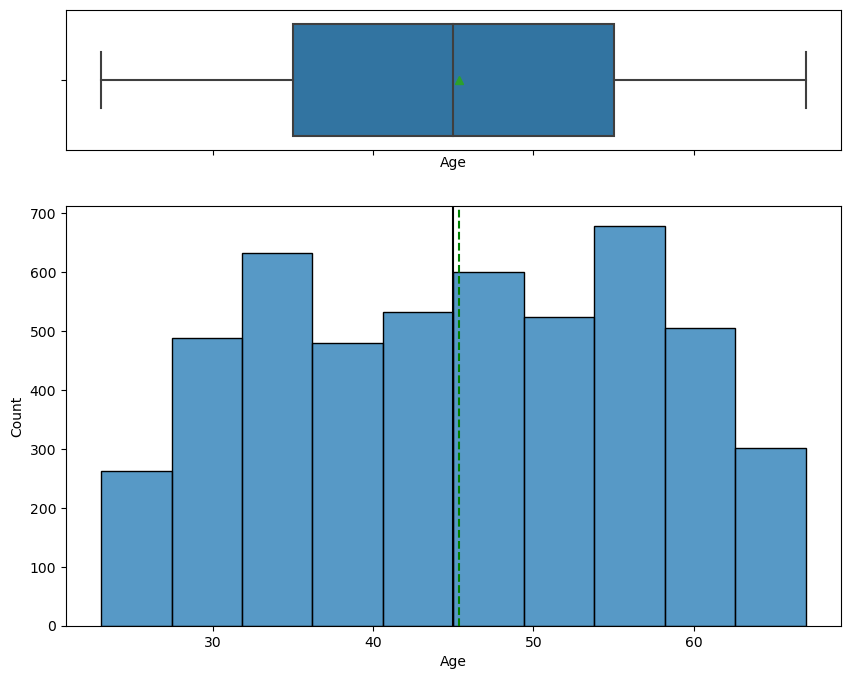

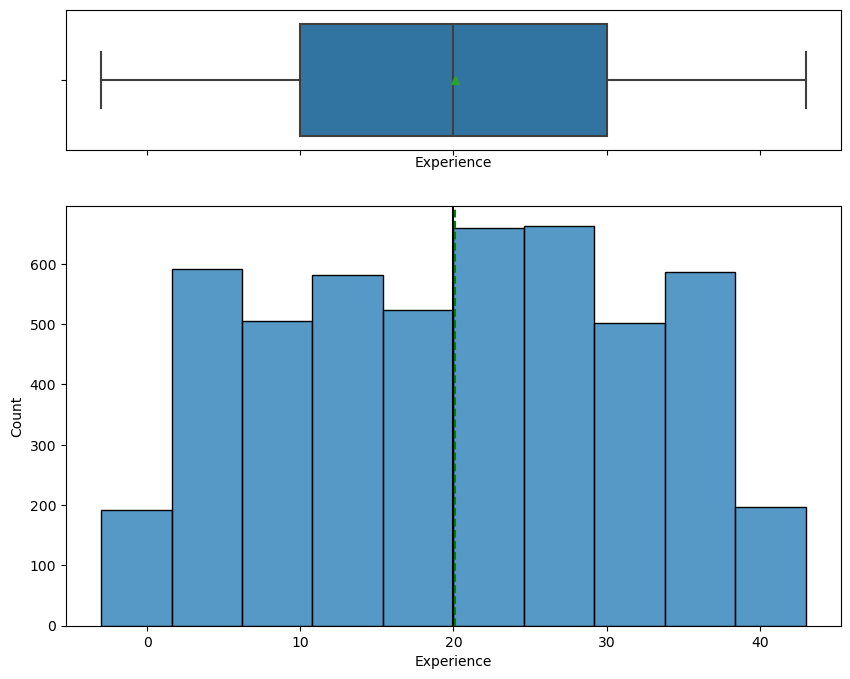

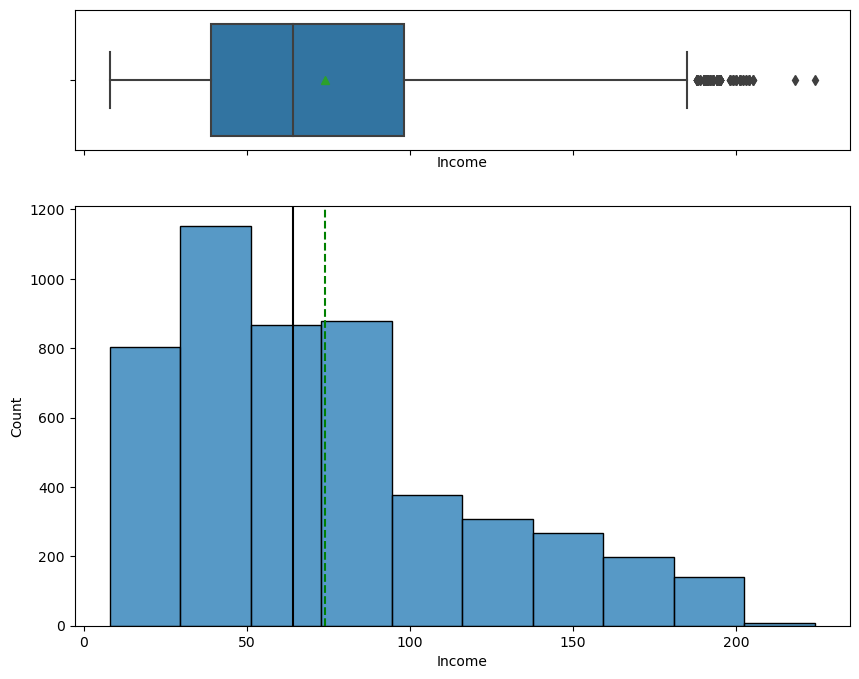

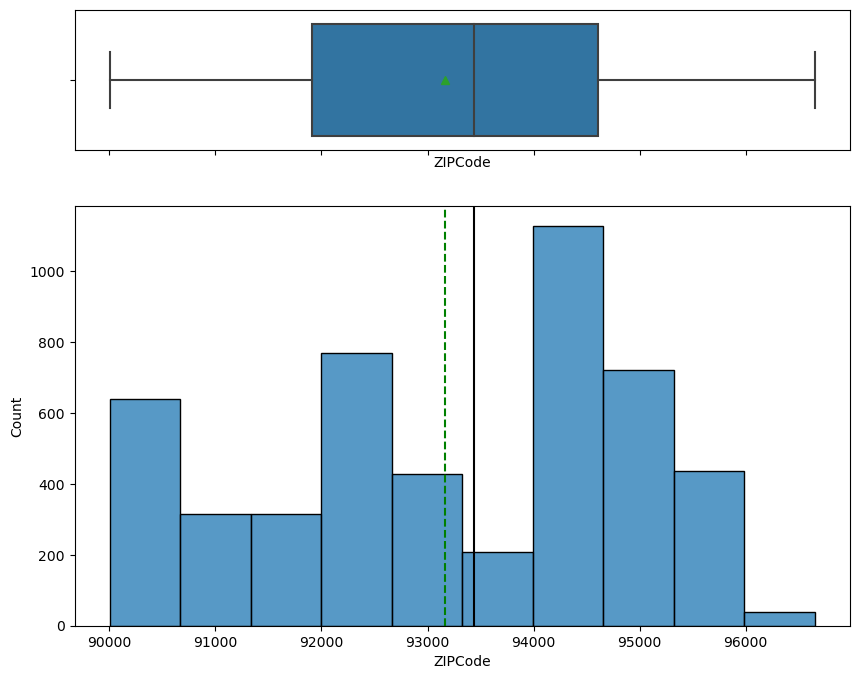

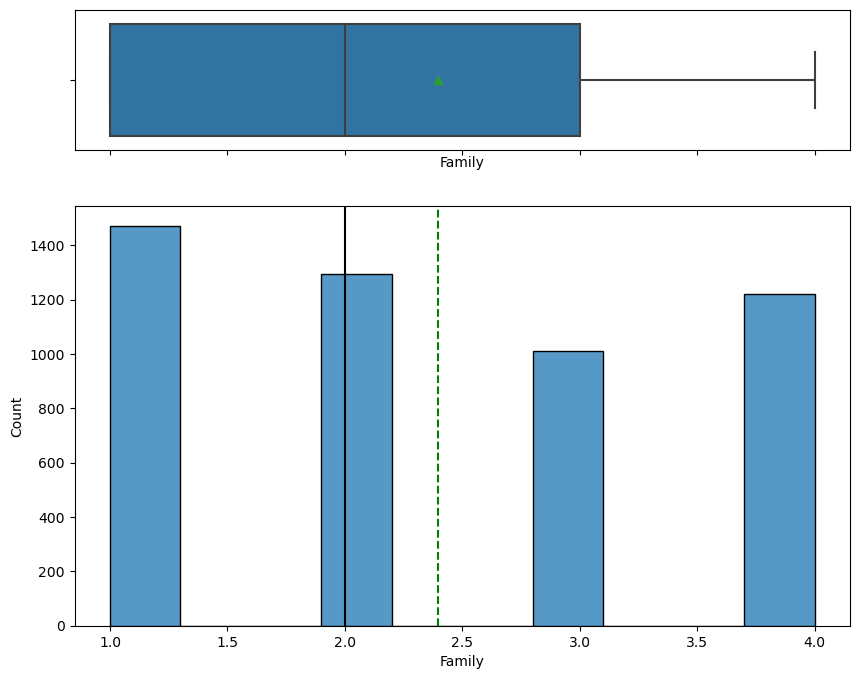

...

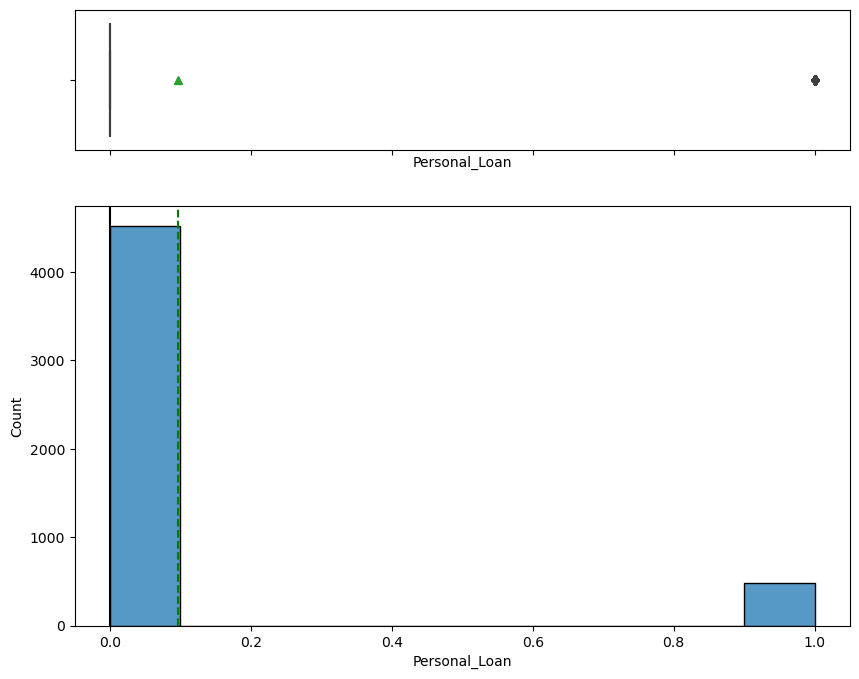

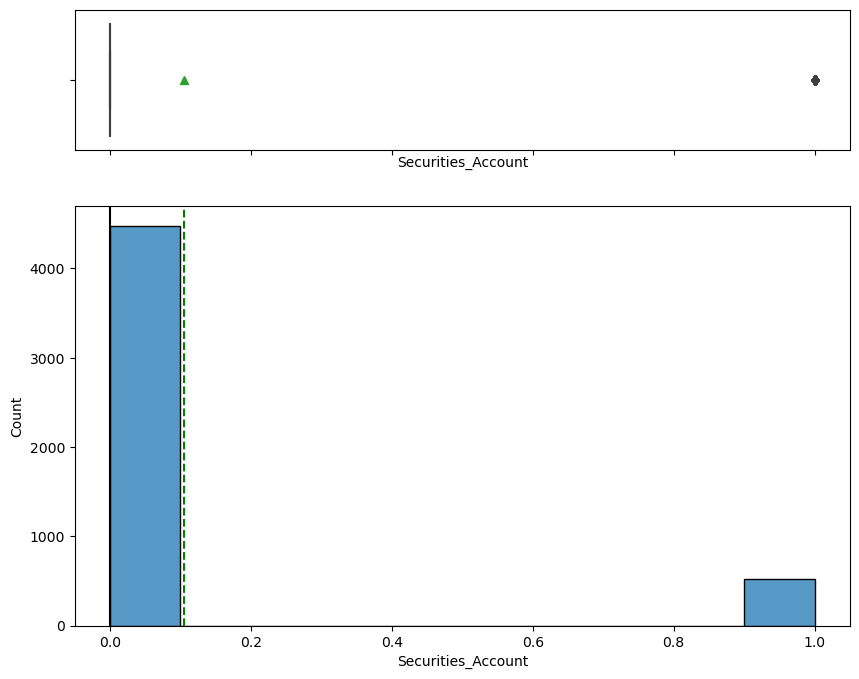

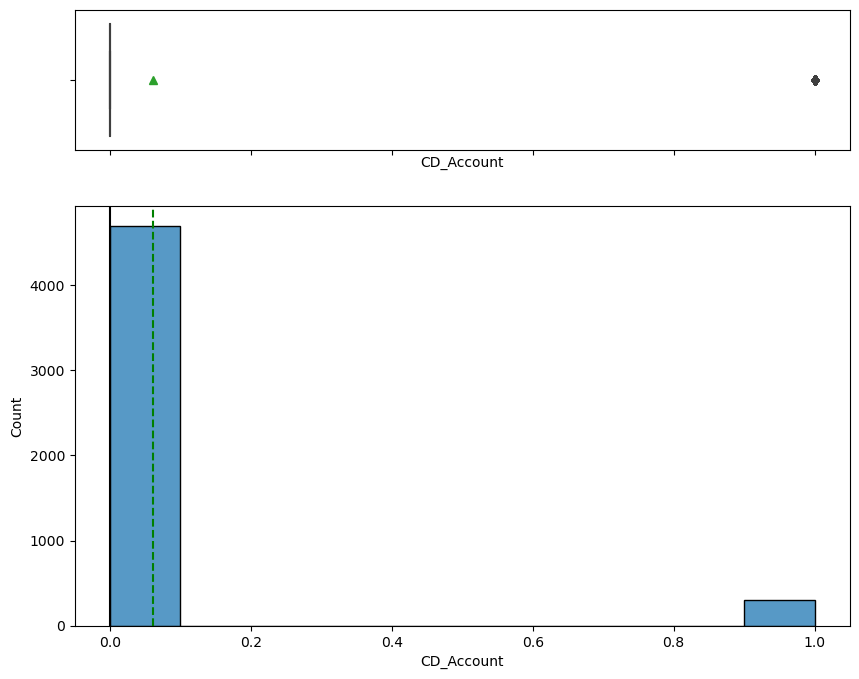

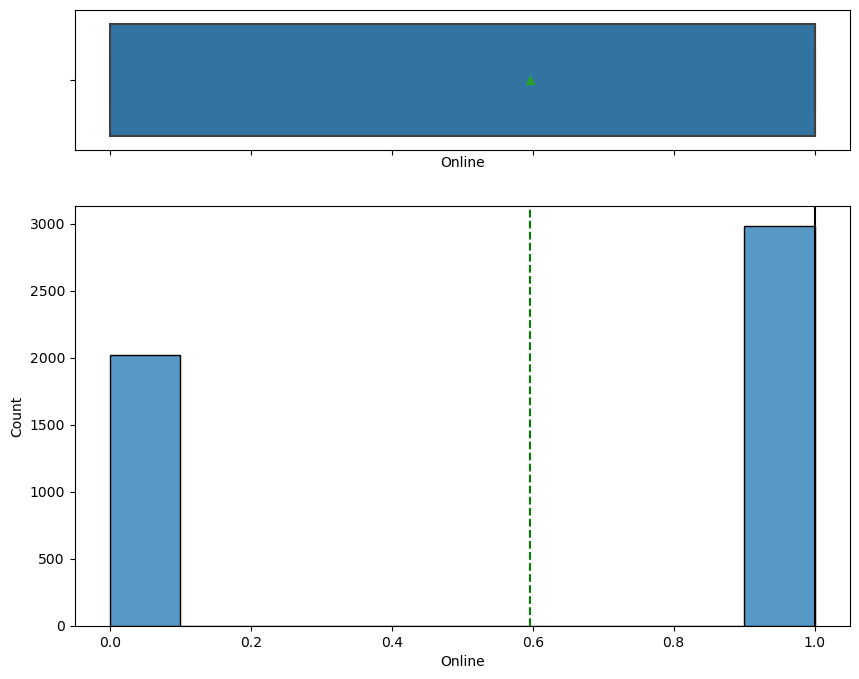

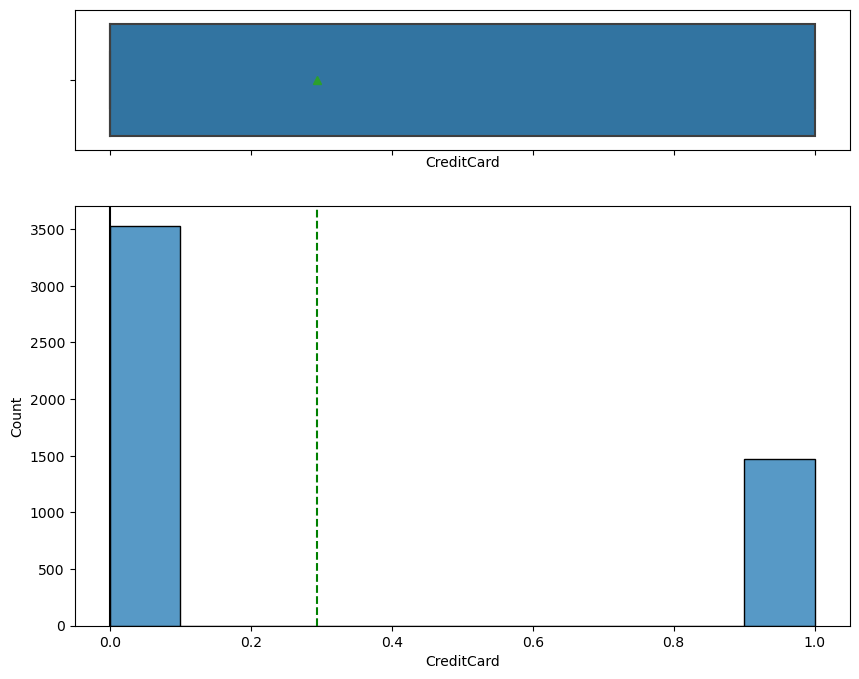

In [24]:

    #univariate_num_plot(plData.Age)
    #print the plot for all columns in dataset 

def univariate_num_plotForDataFrame(df):
  for col in df.columns:
       df1 = df[col]
       univariate_num_plot(df1)
    

    univariate_num_plotForDataFrame(plData)
    

-----------------------------------------


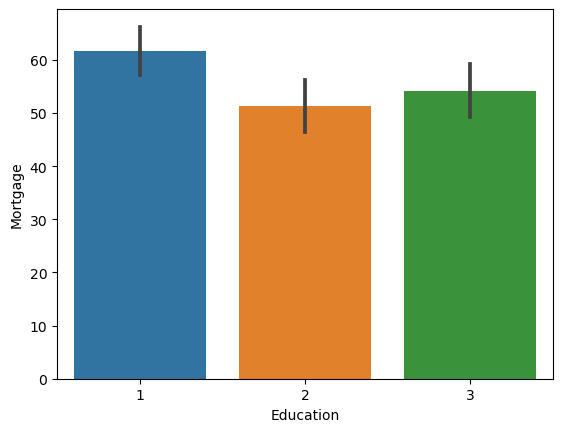

In [25]:
sns.barplot(data= plData, x="Education", y = "Mortgage")

print('-----------------------------------------')


## observation  on the basis of education and mortagage
    ## higher the education lower is the mortagage unless we are not seeing the insights properly 

<AxesSubplot:xlabel='Education', ylabel='Income'>

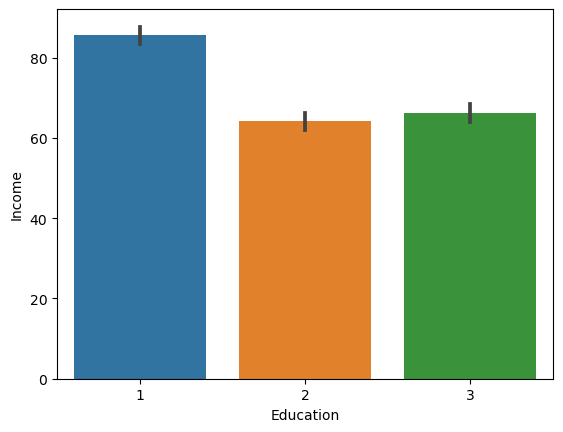

In [26]:

sns.barplot(data= plData, x="Education", y = "Income")


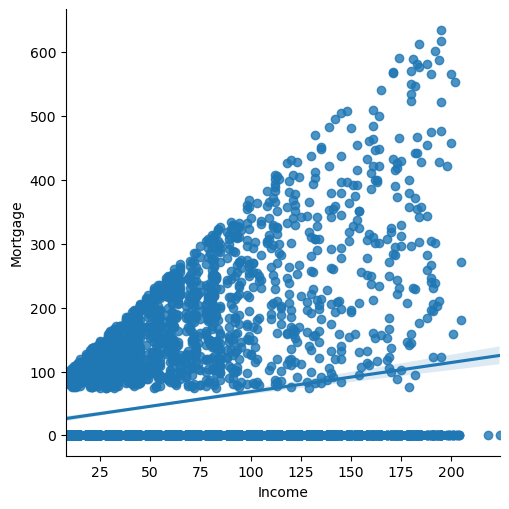

In [27]:

sns.lmplot(data= plData,  x = "Income",y="Mortgage")


#sns.barplot(data= plData,  x = "Income",y="Mortgage", hue = "Education")


# Income increase also tends to increase amound of  mortgage,.
###  however it is very crucial to see amount of mortgage seems to increase higher

## higher education does not have to yield more income 

In [28]:
# Function to create barplots that indicate percentage for each category.


def univariate_cat_plot(data, z):
    """
    plot
    feature: categorical feature
    the function won't work if a column is passed in hue parameter
    """

    total = len(data[z])  # length of the column
    plt.figure(figsize=(15, 5))
    plt.xticks(rotation=45)
    ax = sns.countplot(x=data[z], palette="Paired")
    for p in ax.patches:
        percentage = "{:.1f}%".format(
            100 * p.get_height() / total
        )  # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05  # width of the plot
        y = p.get_y() + p.get_height()  # hieght of the plot

        ax.annotate(percentage, (x, y), size=10)  # annotate the percantage
    plt.show()  # show the plot

# Experience can't be negative so let us take the absolute value 

In [29]:
plData['Experience'] = plData['Experience'].abs()

In [30]:
#modify columns to categorical education , personal loan, credict card, cd account , online 


print(plData['Personal_Loan'].value_counts())
print(plData['Securities_Account'].value_counts())
print(plData['CreditCard'].value_counts())
print(plData['Online'].value_counts())


plData['Personal_Loan'] =  plData['Personal_Loan'].astype('category')
plData['Securities_Account'] =  plData['Securities_Account'].astype('category')
plData['CreditCard'] =  plData['CreditCard'].astype('category')
plData['Online']=  plData['Online'].astype('category')

plData.info()


0    4520
1     480
Name: Personal_Loan, dtype: int64
0    4478
1     522
Name: Securities_Account, dtype: int64
0    3530
1    1470
Name: CreditCard, dtype: int64
1    2984
0    2016
Name: Online, dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Age                 5000 non-null   int64   
 1   Experience          5000 non-null   int64   
 2   Income              5000 non-null   int64   
 3   ZIPCode             5000 non-null   int64   
 4   Family              5000 non-null   int64   
 5   CCAvg               5000 non-null   float64 
 6   Education           5000 non-null   int64   
 7   Mortgage            5000 non-null   int64   
 8   Personal_Loan       5000 non-null   category
 9   Securities_Account  5000 non-null   category
 10  CD_Account          5000 non-null   int64   
 11  Online              5000 no

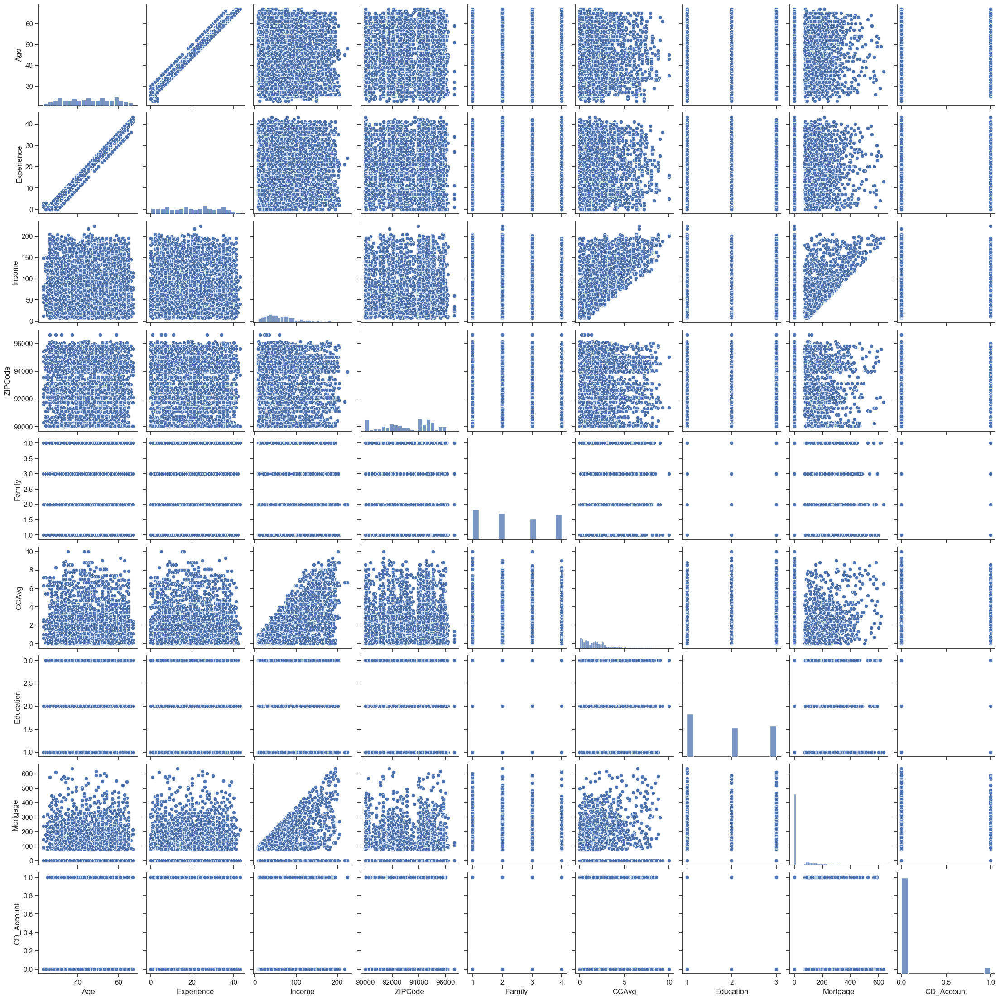

In [31]:
# using pairplot to understand the correlation of all the numerical columns.
sns.set_theme(style="ticks")
sns.pairplot(data=plData)

# Heat Map

<AxesSubplot:>

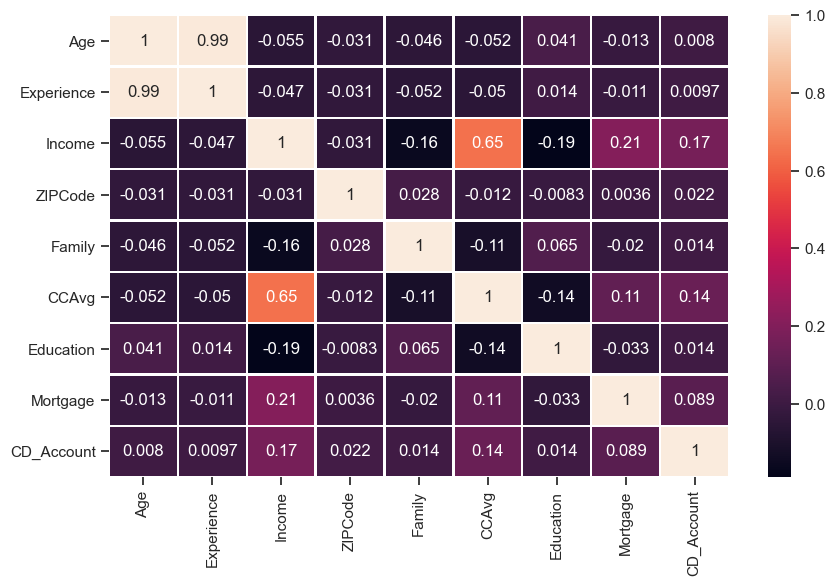

In [32]:
plt.subplots(figsize=(10, 6))
sns.heatmap(plData.corr(), annot=True, linewidths=1)

In [33]:
cData = plData.copy()
# copied into new variable for futher analysis from ehre 

cData['ZIPCode'] = cData['ZIPCode'].astype(np.int32)
cData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   Age                 5000 non-null   int64   
 1   Experience          5000 non-null   int64   
 2   Income              5000 non-null   int64   
 3   ZIPCode             5000 non-null   int32   
 4   Family              5000 non-null   int64   
 5   CCAvg               5000 non-null   float64 
 6   Education           5000 non-null   int64   
 7   Mortgage            5000 non-null   int64   
 8   Personal_Loan       5000 non-null   category
 9   Securities_Account  5000 non-null   category
 10  CD_Account          5000 non-null   int64   
 11  Online              5000 non-null   category
 12  CreditCard          5000 non-null   category
dtypes: category(4), float64(1), int32(1), int64(7)
memory usage: 352.2 KB


# Observation Age and Experience are higly co-related so expeience can be dropped in future if we d not find significance

# Data Preparation from zip code to state so we can easily use it

In [34]:
# from pyzipcode import ZipCodeDatabase
# zcdb = ZipCodeDatabase()

# def zipCodeState(ZIP):
#     try:
#         return zcdb[ZIP].state
#     except:
#         return "";
    
# def zipCodecity(ZIP):
#     try:
#         return zcdb[ZIP].city
#     except:
#         return "";
    
# cData['State'] = cData.apply(lambda row: zipCodeState(row.ZIPCode), axis = 1)
# cData['City'] = cData.apply(lambda row: zipCodecity(row.ZIPCode), axis = 1)



In [35]:
# print(cData['State'].value_counts())
# print(cData['City'].value_counts())

# Observation:
## Entire data belongs to California state, so changing zip code to state does not tell much
##  let us also look for city, this did give good information however, its too much overflow.
##  we also have missing values let us find the relate4d state for them
##  Get unique values for zipcodes so we can get more informatin easily

In [36]:
# cData['State'].value_counts()
# #cData.query(cData['State'].isnull())['ZIPCode']

# frioMurteira = cData[cData['State'] != 'CA']

#  mylist = list(set(frioMurteira.ZIPCode.tolist()))

# print(mylist)


# zip codes are form the following city, state 
    ### Zip Code	City	County
        90201	Bell	Los Angeles County
        90201	Bell Gardens	Los Angeles County
        90201	Cudahy	Los Angeles County
# let us import new library to see if we can get more infomration about county

        ## note: please do import necessary libraries

In [37]:
from uszipcode import SearchEngine
engine = SearchEngine()


def zipCodeCounty(ZIP):
    try:        
        print(ZIP)
        zip = ZIP.astype(np.int32)
        county = engine.by_zipcode(zip).county     
        print(county)
        return county
    except:
        print('not found');


cData['County'] = cData.apply(lambda row: zipCodeCounty(row.ZIPCode), axis = 1)

print(cData['County'].value_counts())

91107.0
Los Angeles County
90089.0
Los Angeles County
94720.0
Alameda County
94112.0
San Francisco County
91330.0
Los Angeles County
92121.0
San Diego County
91711.0
Los Angeles County
93943.0
Monterey County
90089.0
Los Angeles County
93023.0
Ventura County
94710.0
Alameda County
90277.0
Los Angeles County
93106.0
Santa Barbara County
94920.0
Marin County
91741.0
Los Angeles County
95054.0
Santa Clara County
95010.0
Santa Cruz County
94305.0
Santa Clara County
91604.0
Los Angeles County
94720.0
Alameda County
94015.0
San Mateo County
90095.0
Los Angeles County
90277.0
Los Angeles County
91320.0
Ventura County
95521.0
Humboldt County
94305.0
Santa Clara County
95064.0
Santa Cruz County
90064.0
Los Angeles County
94539.0
Alameda County
94104.0
San Francisco County
93106.0
Santa Barbara County
94117.0
San Francisco County
94801.0
Contra Costa County
91330.0
Los Angeles County
94035.0
Santa Clara County
92647.0
Orange County
94720.0
Alameda County
95814.0
Sacramento County
94114.0
San Fra

Los Angeles County
95521.0
Humboldt County
90503.0
Los Angeles County
95136.0
Santa Clara County
94143.0
San Francisco County
95035.0
Santa Clara County
94607.0
Alameda County
91730.0
San Bernardino County
92780.0
Orange County
90009.0
Los Angeles County
92834.0
Orange County
92677.0
Orange County
95616.0
Yolo County
90024.0
Los Angeles County
92518.0
Riverside County
91007.0
Los Angeles County
93023.0
Ventura County
93014.0
Santa Barbara County
94024.0
Santa Clara County
93106.0
Santa Barbara County
90027.0
Los Angeles County
90089.0
Los Angeles County
95207.0
San Joaquin County
91706.0
Los Angeles County
90401.0
Los Angeles County
94305.0
Santa Clara County
92807.0
Orange County
93117.0
Santa Barbara County
94143.0
San Francisco County
92173.0
San Diego County
90717.0
Los Angeles County
94534.0
Solano County
94720.0
Alameda County
94010.0
San Mateo County
95014.0
Santa Clara County
94709.0
Alameda County
94704.0
Alameda County
91614.0
Los Angeles County
94303.0
San Mateo County
94025

90024.0
Los Angeles County
95403.0
Sonoma County
94720.0
Alameda County
95973.0
Butte County
90095.0
Los Angeles County
94720.0
Alameda County
94720.0
Alameda County
93106.0
Santa Barbara County
95831.0
Sacramento County
94304.0
Santa Clara County
91107.0
Los Angeles County
92780.0
Orange County
95616.0
Yolo County
95630.0
Sacramento County
95827.0
Sacramento County
92096.0
San Diego County
94105.0
San Francisco County
94143.0
San Francisco County
95747.0
Placer County
94501.0
Alameda County
90095.0
Los Angeles County
92886.0
Orange County
95812.0
Sacramento County
95819.0
Sacramento County
95136.0
Santa Clara County
95630.0
Sacramento County
95020.0
Santa Clara County
95503.0
Humboldt County
94105.0
San Francisco County
91203.0
Los Angeles County
93111.0
Santa Barbara County
91105.0
Los Angeles County
92220.0
Riverside County
90024.0
Los Angeles County
95008.0
Santa Clara County
90401.0
Los Angeles County
90016.0
Los Angeles County
95035.0
Santa Clara County
90035.0
Los Angeles County

Alameda County
92350.0
San Bernardino County
94305.0
Santa Clara County
94705.0
Alameda County
95758.0
Sacramento County
91711.0
Los Angeles County
92028.0
San Diego County
92106.0
San Diego County
90037.0
Los Angeles County
92131.0
San Diego County
92093.0
San Diego County
94143.0
San Francisco County
94305.0
Santa Clara County
92093.0
San Diego County
94105.0
San Francisco County
92037.0
San Diego County
92028.0
San Diego County
93401.0
San Luis Obispo County
90502.0
Los Angeles County
94122.0
San Francisco County
94035.0
Santa Clara County
95616.0
Yolo County
90049.0
Los Angeles County
95819.0
Sacramento County
95817.0
Sacramento County
90089.0
Los Angeles County
91320.0
Ventura County
90025.0
Los Angeles County
94305.0
Santa Clara County
92606.0
Orange County
92325.0
San Bernardino County
94550.0
Alameda County
93305.0
Kern County
92028.0
San Diego County
93407.0
San Luis Obispo County
90245.0
Los Angeles County
92152.0
San Diego County
90502.0
Los Angeles County
93555.0
Kern Count

Santa Clara County
90740.0
Orange County
90089.0
Los Angeles County
90095.0
Los Angeles County
93940.0
Monterey County
95032.0
Santa Clara County
92647.0
Orange County
90630.0
Orange County
90245.0
Los Angeles County
94114.0
San Francisco County
90210.0
Los Angeles County
90291.0
Los Angeles County
94132.0
San Francisco County
93014.0
Santa Barbara County
94301.0
Santa Clara County
94105.0
San Francisco County
93117.0
Santa Barbara County
92064.0
San Diego County
95039.0
Monterey County
95070.0
Santa Clara County
94920.0
Marin County
91380.0
Los Angeles County
91320.0
Ventura County
94923.0
Sonoma County
93106.0
Santa Barbara County
92182.0
San Diego County
93437.0
Santa Barbara County
95014.0
Santa Clara County
92054.0
San Diego County
91910.0
San Diego County
92121.0
San Diego County
94720.0
Alameda County
94104.0
San Francisco County
91754.0
Los Angeles County
94607.0
Alameda County
95747.0
Placer County
94949.0
Marin County
95035.0
Santa Clara County
95821.0
Sacramento County
95039

Santa Clara County
94501.0
Alameda County
92093.0
San Diego County
94542.0
Alameda County
92182.0
San Diego County
92037.0
San Diego County
92704.0
Orange County
92093.0
San Diego County
95616.0
Yolo County
95126.0
Santa Clara County
90245.0
Los Angeles County
94304.0
Santa Clara County
94109.0
San Francisco County
93943.0
Monterey County
92038.0
San Diego County
93106.0
Santa Barbara County
95819.0
Sacramento County
93943.0
Monterey County
94611.0
Alameda County
92521.0
Riverside County
94720.0
Alameda County
95054.0
Santa Clara County
94303.0
San Mateo County
95616.0
Yolo County
93943.0
Monterey County
94005.0
San Mateo County
94025.0
San Mateo County
95762.0
El Dorado County
94309.0
Santa Clara County
90095.0
Los Angeles County
92096.0
San Diego County
92630.0
Orange County
94061.0
San Mateo County
95125.0
Santa Clara County
92007.0
San Diego County
91605.0
Los Angeles County
93105.0
Santa Barbara County
92407.0
San Bernardino County
95060.0
Santa Cruz County
94025.0
San Mateo Count

Alameda County
90095.0
Los Angeles County
92831.0
Orange County
94304.0
Santa Clara County
94024.0
Santa Clara County
94109.0
San Francisco County
94132.0
San Francisco County
95136.0
Santa Clara County
91711.0
Los Angeles County
90028.0
Los Angeles County
94720.0
Alameda County
94701.0
Alameda County
94608.0
Alameda County
94110.0
San Francisco County
91910.0
San Diego County
95670.0
Sacramento County
94309.0
Santa Clara County
94701.0
Alameda County
92009.0
San Diego County
91330.0
Los Angeles County
91007.0
Los Angeles County
95814.0
Sacramento County
90245.0
Los Angeles County
92121.0
San Diego County
95827.0
Sacramento County
94304.0
Santa Clara County
94542.0
Alameda County
92354.0
San Bernardino County
92843.0
Orange County
95192.0
Santa Clara County
94035.0
Santa Clara County
90717.0
Los Angeles County
92675.0
Orange County
91335.0
Los Angeles County
93101.0
Santa Barbara County
94005.0
San Mateo County
95616.0
Yolo County
90019.0
Los Angeles County
90007.0
Los Angeles County
9

Sacramento County
92093.0
San Diego County
90095.0
Los Angeles County
90064.0
Los Angeles County
95054.0
Santa Clara County
95051.0
Santa Clara County
95070.0
Santa Clara County
92093.0
San Diego County
94588.0
Alameda County
92521.0
Riverside County
93943.0
Monterey County
90245.0
Los Angeles County
94708.0
Alameda County
95449.0
Mendocino County
95211.0
San Joaquin County
94132.0
San Francisco County
93117.0
Santa Barbara County
92037.0
San Diego County
90272.0
Los Angeles County
94309.0
Santa Clara County
95616.0
Yolo County
96001.0
Shasta County
94501.0
Alameda County
94608.0
Alameda County
90503.0
Los Angeles County
93108.0
Santa Barbara County
94301.0
Santa Clara County
91304.0
Los Angeles County
91770.0
Los Angeles County
94305.0
Santa Clara County
92647.0
Orange County
92116.0
San Diego County
92521.0
Riverside County
90032.0
Los Angeles County
94720.0
Alameda County
92154.0
San Diego County
90064.0
Los Angeles County
94720.0
Alameda County
92037.0
San Diego County
91773.0
Los 

Alameda County
94110.0
San Francisco County
90058.0
Los Angeles County
91768.0
Los Angeles County
95133.0
Santa Clara County
94025.0
San Mateo County
95020.0
Santa Clara County
90059.0
Los Angeles County
93561.0
Kern County
94521.0
Contra Costa County
90041.0
Los Angeles County
93943.0
Monterey County
91335.0
Los Angeles County
93955.0
Monterey County
95131.0
Santa Clara County
93106.0
Santa Barbara County
91311.0
Los Angeles County
94122.0
San Francisco County
92008.0
San Diego County
90024.0
Los Angeles County
92691.0
Orange County
94542.0
Alameda County
90277.0
Los Angeles County
91950.0
San Diego County
90005.0
Los Angeles County
94305.0
Santa Clara County
90041.0
Los Angeles County
91116.0
Los Angeles County
95814.0
Sacramento County
91711.0
Los Angeles County
91768.0
Los Angeles County
95008.0
Santa Clara County
95819.0
Sacramento County
95054.0
Santa Clara County
95814.0
Sacramento County
90840.0
Los Angeles County
96003.0
Shasta County
90630.0
Orange County
94035.0
Santa Clara 

San Diego County
94709.0
Alameda County
91365.0
Los Angeles County
94928.0
Sonoma County
92350.0
San Bernardino County
90095.0
Los Angeles County
92614.0
Orange County
92831.0
Orange County
94105.0
San Francisco County
94305.0
Santa Clara County
92152.0
San Diego County
91902.0
San Diego County
94304.0
Santa Clara County
95112.0
Santa Clara County
95616.0
Yolo County
91765.0
Los Angeles County
90095.0
Los Angeles County
93003.0
Ventura County
90401.0
Los Angeles County
94143.0
San Francisco County
94305.0
Santa Clara County
91103.0
Los Angeles County
94234.0
Sacramento County
92691.0
Orange County
92521.0
Riverside County
90089.0
Los Angeles County
94010.0
San Mateo County
91910.0
San Diego County
94720.0
Alameda County
95351.0
Stanislaus County
93727.0
Fresno County
94022.0
Santa Clara County
94577.0
Alameda County
92115.0
San Diego County
95747.0
Placer County
91320.0
Ventura County
90232.0
Los Angeles County
95131.0
Santa Clara County
90095.0
Los Angeles County
94143.0
San Francisco

In [38]:
# sameple to shwo the output of the library 
#cData['County'].value_counts()

engine.by_zipcode(91950).county

'San Diego County'

# County is the right choice as it has limited number of categoy varables and they can be encoded to give us better results 


# Spliting the data
### We will use 70% of data for training and 30% for testing.

In [39]:
# cData= cData.drop('State',axis=1) 
# cData = cData.drop('City',axis=1) 
# cData.info()

# Create Dummies for Education and County

In [40]:
cData= cData.drop('Experience',axis=1) 
cData = cData.drop('ZIPCode',axis=1) 

In [41]:
oneHotCols=["County","Education"]
cData = pd.get_dummies(cData, columns=oneHotCols, drop_first=True)
cData.head(10)
# see the data and to have a glimpse of how it appreas after the dumies ceraton 

,Age,Income,Family,CCAvg,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,...,County_Siskiyou County,County_Solano County,County_Sonoma County,County_Stanislaus County,County_Trinity County,County_Tuolumne County,County_Ventura County,County_Yolo County,Education_2,Education_3
0,25,49,4,1.6,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,45,34,3,1.5,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,39,11,1,1.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,35,100,1,2.7,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4,35,45,4,1.0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,1,0
5,37,29,4,0.4,155,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
6,53,72,2,1.5,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
7,50,22,1,0.3,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
8,35,81,3,0.6,104,0,0,0,1,0,...,0,0,0,0,0,0,0,0,1,0
9,34,180,1,8.9,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,1


In [42]:
from sklearn.model_selection import train_test_split

X = cData.drop('Personal_Loan',axis=1)     # Predictor feature columns (8 X m)
Y = cData['Personal_Loan']   # Predicted class (1=True, 0=False) (1 X m)

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)
# 1 is just any random seed number

X_train.head()

,Age,Income,Family,CCAvg,Mortgage,Securities_Account,CD_Account,Online,CreditCard,County_Butte County,...,County_Siskiyou County,County_Solano County,County_Sonoma County,County_Stanislaus County,County_Trinity County,County_Tuolumne County,County_Ventura County,County_Yolo County,Education_2,Education_3
1334,47,35,2,1.3,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4768,38,39,1,2.0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
65,59,131,1,3.8,0,0,0,1,1,0,...,0,0,0,0,0,0,1,0,0,0
177,29,65,4,1.8,244,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
4489,39,21,3,0.2,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0


In [43]:
print(X_train.shape, X_test.shape)

(3500, 48) (1500, 48)


In [44]:
print("Shape of Training set : ", X_train.shape)
print("Shape of test set : ", X_test.shape)
print("Percentage of classes in training set:")
print(y_train.value_counts(normalize=True))
print("Percentage of classes in test set:")
print(y_test.value_counts(normalize=True))

Shape of Training set :  (3500, 48)
Shape of test set :  (1500, 48)
Percentage of classes in training set:
0    0.905429
1    0.094571
Name: Personal_Loan, dtype: float64
Percentage of classes in test set:
0    0.900667
1    0.099333
Name: Personal_Loan, dtype: float64


# Logistic Regression

In [45]:
# from sklearn.linear_model import LogisticRegression

# Fit the model on train
model = LogisticRegression(solver="newton-cg", n_jobs=-1, random_state=1, max_iter=100)

In [46]:
# Sequential feature selector is present in mlxtend library
# !pip install mlxtend to install mlxtent library

from mlxtend.feature_selection import SequentialFeatureSelector as SFS

# to plot the performance with addition of each feature
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

In [47]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn

def model_performance_classification_sklearn_with_threshold(model, predictors, target, threshold=0.5):
    """
    Function to compute different metrics, based on the threshold specified, to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # predicting using the independent variables
    pred_prob = model.predict_proba(predictors)[:, 1]
    pred_thres = pred_prob > threshold
    pred = np.round(pred_thres)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "Accuracy": acc,
            "Recall": recall,
            "Precision": precision,
            "F1": f1,
        },
        index=[0],
    )

    return df_perf


In [48]:
# defining a function to plot the confusion_matrix of a classification model built using sklearn
def confusion_matrix_sklearn_with_threshold(model, predictors, target, threshold=0.5):
    """
    To plot the confusion_matrix, based on the threshold specified, with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """
    pred_prob = model.predict_proba(predictors)[:, 1]
    pred_thres = pred_prob > threshold
    y_pred = np.round(pred_thres)

    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [49]:
# There are different solvers available in Sklearn logistic regression
# The newton-cg solver is faster for high-dimensional data

lg = LogisticRegression(solver="newton-cg", random_state=1)
model = lg.fit(X_train, y_train)

In [50]:
# let us check the coefficients and intercept of the model

coef_df = pd.DataFrame(
    np.append(lg.coef_, lg.intercept_),
    index=X_train.columns.tolist() + ["Intercept"],
    columns=["Coefficients"],
)
coef_df.T

,Age,Income,Family,CCAvg,Mortgage,Securities_Account,CD_Account,Online,CreditCard,County_Butte County,...,County_Solano County,County_Sonoma County,County_Stanislaus County,County_Trinity County,County_Tuolumne County,County_Ventura County,County_Yolo County,Education_2,Education_3,Intercept
Coefficients,0.004693,0.055125,0.652093,0.186994,0.000972,-0.801887,3.13328,-0.559534,-0.89957,-0.1654,...,0.310642,0.403406,-0.189497,-0.064858,-0.115432,0.252887,-0.456706,3.291748,3.413766,-12.568616


In [51]:
# converting coefficients to odds
odds = np.exp(lg.coef_[0])

# finding the percentage change
perc_change_odds = (np.exp(lg.coef_[0]) - 1) * 100

# removing limit from number of columns to display
pd.set_option("display.max_columns", None)

# adding the odds to a dataframe
pd.DataFrame({"Odds": odds, "Change_odd%": perc_change_odds}, index=X_train.columns).T

,Age,Income,Family,CCAvg,Mortgage,Securities_Account,CD_Account,Online,CreditCard,County_Butte County,County_Contra Costa County,County_El Dorado County,County_Fresno County,County_Humboldt County,County_Imperial County,County_Kern County,County_Lake County,County_Los Angeles County,County_Marin County,County_Mendocino County,County_Merced County,County_Monterey County,County_Napa County,County_Orange County,County_Placer County,County_Riverside County,County_Sacramento County,County_San Benito County,County_San Bernardino County,County_San Diego County,County_San Francisco County,County_San Joaquin County,County_San Luis Obispo County,County_San Mateo County,County_Santa Barbara County,County_Santa Clara County,County_Santa Cruz County,County_Shasta County,County_Siskiyou County,County_Solano County,County_Sonoma County,County_Stanislaus County,County_Trinity County,County_Tuolumne County,County_Ventura County,County_Yolo County,Education_2,Education_3
Odds,1.004704,1.056672,1.919555,1.205620,1.000973,0.448482,22.949121,0.571475,0.406745,0.847555,1.438458,0.875772,0.856524,0.658480,0.988341,2.164392,0.981311,0.988513,1.438813,0.833860,0.790345,1.047721,0.993574,1.055179,1.713518,2.749026,1.096470,0.862392,0.518686,1.183361,1.259827,0.994151,0.695167,0.375445,1.242441,1.217847,1.106507,0.836591,0.960759,1.364301,1.496915,0.827376,0.937201,0.890981,1.287738,0.633367,26.889829,30.379439
Change_odd%,0.470416,5.667247,91.955506,20.562031,0.097293,-55.151803,2194.912071,-42.852457,-59.325531,-15.244540,43.845756,-12.422782,-14.347622,-34.151967,-1.165904,116.439221,-1.868903,-1.148656,43.881293,-16.614002,-20.965546,4.772149,-0.642561,5.517937,71.351789,174.902636,9.646966,-13.760847,-48.131416,18.336133,25.982699,-0.584870,-30.483329,-62.455527,24.244132,21.784730,10.650655,-16.340864,-3.924065,36.430139,49.691478,-17.262440,-6.279909,-10.901850,28.773830,-36.663321,2588.982852,2937.943933


In [52]:
model_score = model.score(X_test, y_test)
print(model_score)

0.9566666666666667


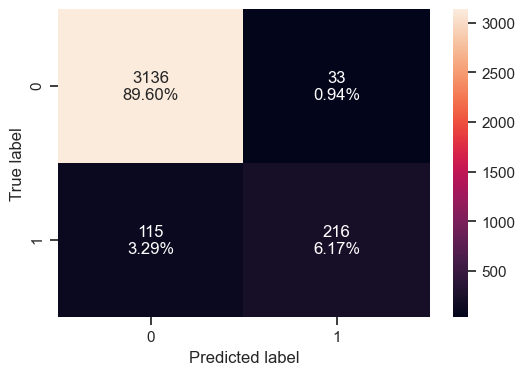

In [53]:
# creating confusion matrix
confusion_matrix_sklearn_with_threshold(lg, X_train, y_train)

In [54]:
log_reg_model_train_perf = model_performance_classification_sklearn_with_threshold(
    lg, X_train, y_train
)

print("Training performance:")
log_reg_model_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
0,0.957714,0.652568,0.86747,0.744828


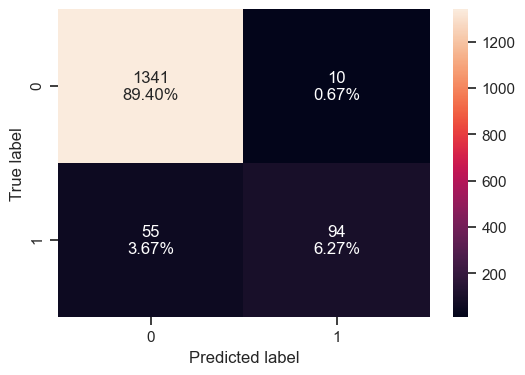

In [55]:
# creating confusion matrix
confusion_matrix_sklearn_with_threshold(lg, X_test, y_test)

In [56]:
log_reg_model_test_perf = model_performance_classification_sklearn_with_threshold(
    lg, X_test, y_test
)

print("Test set performance:")
log_reg_model_test_perf

Test set performance:


,Accuracy,Recall,Precision,F1
0,0.956667,0.630872,0.903846,0.743083


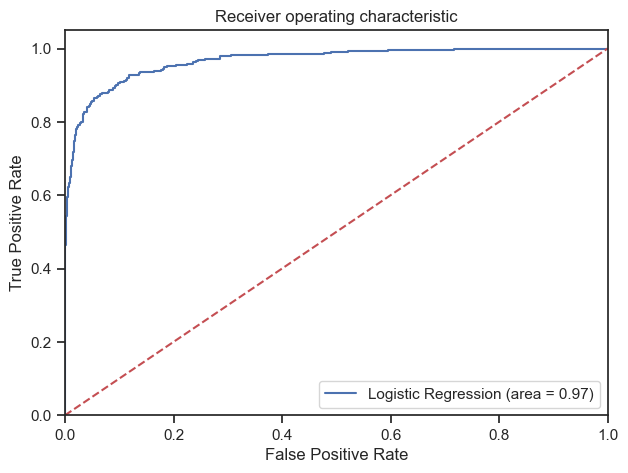

In [57]:
logit_roc_auc_train = roc_auc_score(y_train, lg.predict_proba(X_train)[:, 1])
fpr, tpr, thresholds = roc_curve(y_train, lg.predict_proba(X_train)[:, 1])
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label="Logistic Regression (area = %0.2f)" % logit_roc_auc_train)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")


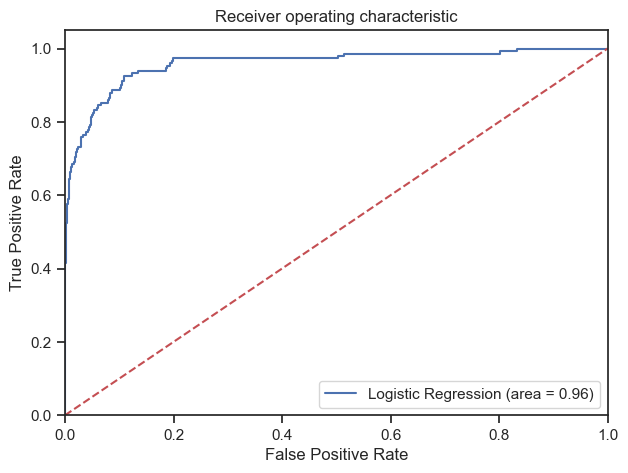

In [58]:
logit_roc_auc_test = roc_auc_score(y_test, lg.predict_proba(X_test)[:, 1])
fpr, tpr, thresholds = roc_curve(y_test, lg.predict_proba(X_test)[:, 1])
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, label="Logistic Regression (area = %0.2f)" % logit_roc_auc_test)
plt.plot([0, 1], [0, 1], "r--")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver operating characteristic")
plt.legend(loc="lower right")


In [59]:
# Optimal threshold as per AUC-ROC curve
# The optimal cut off would be where tpr is high and fpr is low
fpr, tpr, thresholds = roc_curve(y_train, lg.predict_proba(X_train)[:, 1])

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold_auc_roc = thresholds[optimal_idx]
print(optimal_threshold_auc_roc)

0.15295211034078635


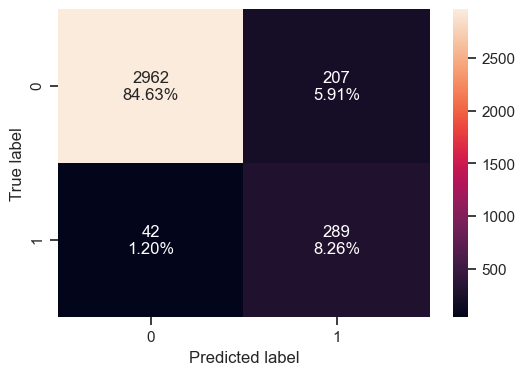

In [60]:
# creating confusion matrix
confusion_matrix_sklearn_with_threshold(
    lg, X_train, y_train, threshold=optimal_threshold_auc_roc
)

In [61]:
# checking model performance for this model
log_reg_model_train_perf_threshold_auc_roc = model_performance_classification_sklearn_with_threshold(
    lg, X_train, y_train, threshold=optimal_threshold_auc_roc
)
print("Training performance:")
log_reg_model_train_perf_threshold_auc_roc

Training performance:


,Accuracy,Recall,Precision,F1
0,0.928857,0.873112,0.582661,0.698912


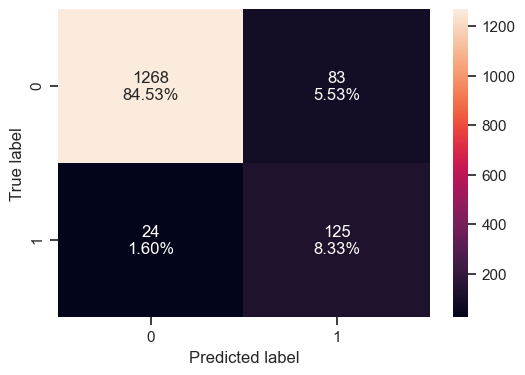

In [62]:
# creating confusion matrix
confusion_matrix_sklearn_with_threshold(
    lg, X_test, y_test, threshold=optimal_threshold_auc_roc
)

In [63]:
# checking model performance for this model
log_reg_model_test_perf_threshold_auc_roc = model_performance_classification_sklearn_with_threshold(
    lg, X_test, y_test, threshold=optimal_threshold_auc_roc
)
print("Test set performance:")
log_reg_model_test_perf_threshold_auc_roc

Test set performance:


,Accuracy,Recall,Precision,F1
0,0.928667,0.838926,0.600962,0.70028


#### Let's use Precision-Recall curve and see if we can find a better threshold

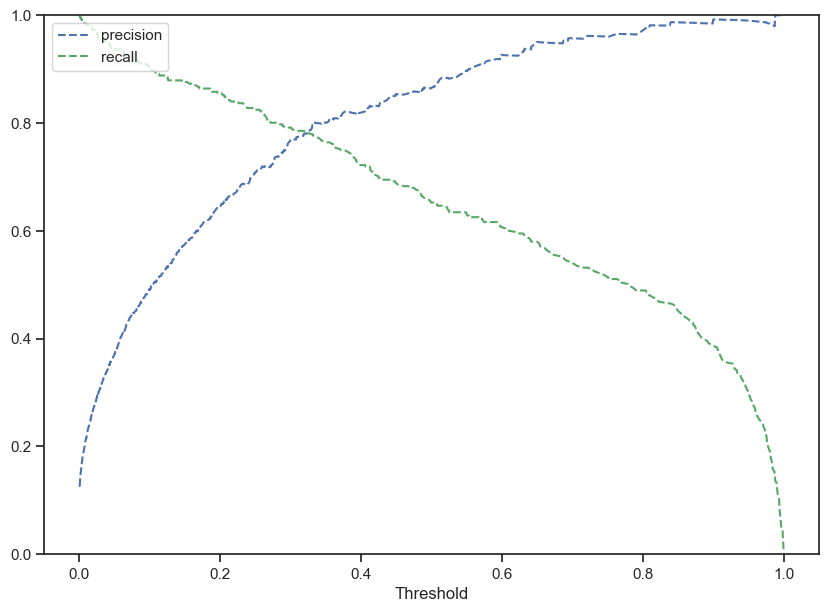

In [64]:
y_scores = lg.predict_proba(X_train)[:, 1]
prec, rec, tre = precision_recall_curve(y_train, y_scores,)


def plot_prec_recall_vs_tresh(precisions, recalls, thresholds):
    plt.plot(thresholds, precisions[:-1], "b--", label="precision")
    plt.plot(thresholds, recalls[:-1], "g--", label="recall")
    plt.xlabel("Threshold")
    plt.legend(loc="upper left")
    plt.ylim([0, 1])


plt.figure(figsize=(10, 7))
plot_prec_recall_vs_tresh(prec, rec, tre)


* At the threshold of 0.58, we get balanced recall and precision.

In [65]:
# setting the threshold
optimal_threshold_curve = 0.33

Checking model performance on training set

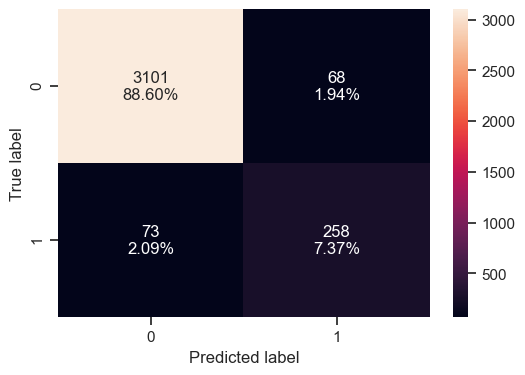

In [66]:
# creating confusion matrix
confusion_matrix_sklearn_with_threshold(
    lg, X_train, y_train, threshold=optimal_threshold_curve
)

In [67]:
log_reg_model_train_perf_threshold_curve = model_performance_classification_sklearn_with_threshold(
    lg, X_train, y_train, threshold=optimal_threshold_curve
)
print("Training performance:")
log_reg_model_train_perf_threshold_curve

Training performance:


,Accuracy,Recall,Precision,F1
0,0.959714,0.779456,0.791411,0.785388


Checking model performance on test set

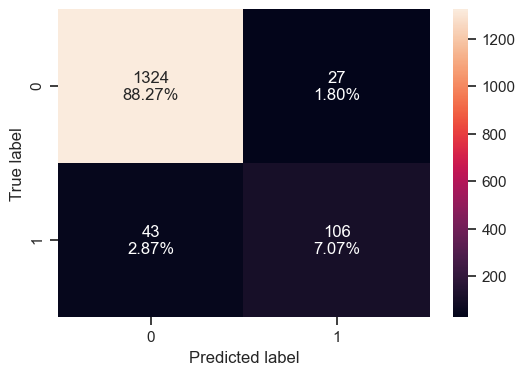

In [68]:
# creating confusion matrix
confusion_matrix_sklearn_with_threshold(
    lg, X_test, y_test, threshold=optimal_threshold_curve
)

In [69]:
log_reg_model_test_perf_threshold_curve = model_performance_classification_sklearn_with_threshold(
    lg, X_test, y_test, threshold=optimal_threshold_curve
)
print("Test set performance:")
log_reg_model_test_perf_threshold_curve

Test set performance:


,Accuracy,Recall,Precision,F1
0,0.953333,0.711409,0.796992,0.751773


Model is performing well on training and test.
There's not much improvement in the model performance as the default threshold is 0.50 and here we get 0.58 as the optimal threshold.

##### Model Performance Summary

In [70]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        log_reg_model_train_perf.T,
        log_reg_model_train_perf_threshold_auc_roc.T,
        log_reg_model_train_perf_threshold_curve.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Logistic Regression sklearn",
    "Logistic Regression-0.13 Threshold",
    "Logistic Regression-0.33 Threshold",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Logistic Regression sklearn,Logistic Regression-0.13 Threshold,Logistic Regression-0.33 Threshold
Accuracy,0.957714,0.928857,0.959714
Recall,0.652568,0.873112,0.779456
Precision,0.867470,0.582661,0.791411
F1,0.744828,0.698912,0.785388


In [71]:
# testing performance comparison

models_test_comp_df = pd.concat(
    [
        log_reg_model_test_perf.T,
        log_reg_model_test_perf_threshold_auc_roc.T,
        log_reg_model_test_perf_threshold_curve.T,
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Logistic Regression sklearn",
    "Logistic Regression-0.13 Threshold",
    "Logistic Regression-0.33 Threshold",
]
print("Test set performance comparison:")
models_test_comp_df

Test set performance comparison:


,Logistic Regression sklearn,Logistic Regression-0.13 Threshold,Logistic Regression-0.33 Threshold
Accuracy,0.956667,0.928667,0.953333
Recall,0.630872,0.838926,0.711409
Precision,0.903846,0.600962,0.796992
F1,0.743083,0.700280,0.751773


# Build Decision Tree Model

In [72]:
dcData = cData.copy()
X = dcData.drop("Personal_Loan" , axis=1)
y = dcData.pop("Personal_Loan")

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.30, random_state=1)

In [74]:
dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
dTree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=1)

# Scoring our Decision Tree

In [75]:
print("Accuracy on training set : ",dTree.score(X_train, y_train))
print("Accuracy on test set : ",dTree.score(X_test, y_test))

Accuracy on training set :  1.0
Accuracy on test set :  0.98


In [76]:
## Function to create confusion matrix
def make_confusion_matrix(model,y_actual,labels=[1, 0]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth  
    
    '''
    y_predict = model.predict(X_test)
    cm=metrics.confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [77]:
##  Function to calculate recall score
def get_recall_score(model):
    '''
    model : classifier to predict values of X

    '''
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
    print("Recall on test set : ",metrics.recall_score(y_test,pred_test))

## Confusion Matrix For DTree

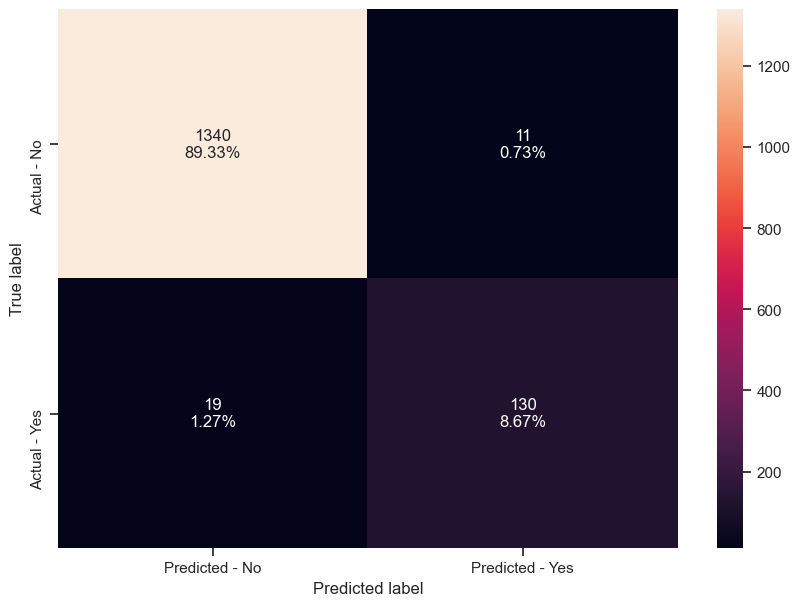

In [78]:
make_confusion_matrix(dTree,y_test)

In [79]:
# Recall on train and test
get_recall_score(dTree)

Recall on training set :  1.0
Recall on test set :  0.87248322147651


## ## Visualizing the Decision Tree

In [80]:
feature_names = list(X.columns)
print(feature_names)

['Age', 'Income', 'Family', 'CCAvg', 'Mortgage', 'Securities_Account', 'CD_Account', 'Online', 'CreditCard', 'County_Butte County', 'County_Contra Costa County', 'County_El Dorado County', 'County_Fresno County', 'County_Humboldt County', 'County_Imperial County', 'County_Kern County', 'County_Lake County', 'County_Los Angeles County', 'County_Marin County', 'County_Mendocino County', 'County_Merced County', 'County_Monterey County', 'County_Napa County', 'County_Orange County', 'County_Placer County', 'County_Riverside County', 'County_Sacramento County', 'County_San Benito County', 'County_San Bernardino County', 'County_San Diego County', 'County_San Francisco County', 'County_San Joaquin County', 'County_San Luis Obispo County', 'County_San Mateo County', 'County_Santa Barbara County', 'County_Santa Clara County', 'County_Santa Cruz County', 'County_Shasta County', 'County_Siskiyou County', 'County_Solano County', 'County_Sonoma County', 'County_Stanislaus County', 'County_Trinity 

[Text(1054.4558823529412, 2221.153846153846, 'node #0\nIncome <= 116.5\ngini = 0.171\nsamples = 3500\nvalue = [3169, 331]\nclass = y[0]'),
 Text(617.2647058823529, 2043.4615384615386, 'node #1\nCCAvg <= 2.95\ngini = 0.042\nsamples = 2856\nvalue = [2794, 62]\nclass = y[0]'),
 Text(284.4705882352941, 1865.769230769231, 'node #2\nIncome <= 106.5\ngini = 0.008\nsamples = 2642\nvalue = [2632, 10]\nclass = y[0]'),
 Text(255.2941176470588, 1688.076923076923, 'node #3\ngini = 0.0\nsamples = 2553\nvalue = [2553, 0]\nclass = y[0]'),
 Text(313.6470588235294, 1688.076923076923, 'node #4\nFamily <= 3.5\ngini = 0.199\nsamples = 89\nvalue = [79, 10]\nclass = y[0]'),
 Text(189.64705882352942, 1510.3846153846155, 'node #5\nCounty_Santa Barbara County <= 0.5\ngini = 0.087\nsamples = 66\nvalue = [63, 3]\nclass = y[0]'),
 Text(116.70588235294117, 1332.6923076923076, 'node #6\nAge <= 28.5\ngini = 0.061\nsamples = 64\nvalue = [62, 2]\nclass = y[0]'),
 Text(58.35294117647059, 1155.0, 'node #7\nEducation_2 <=

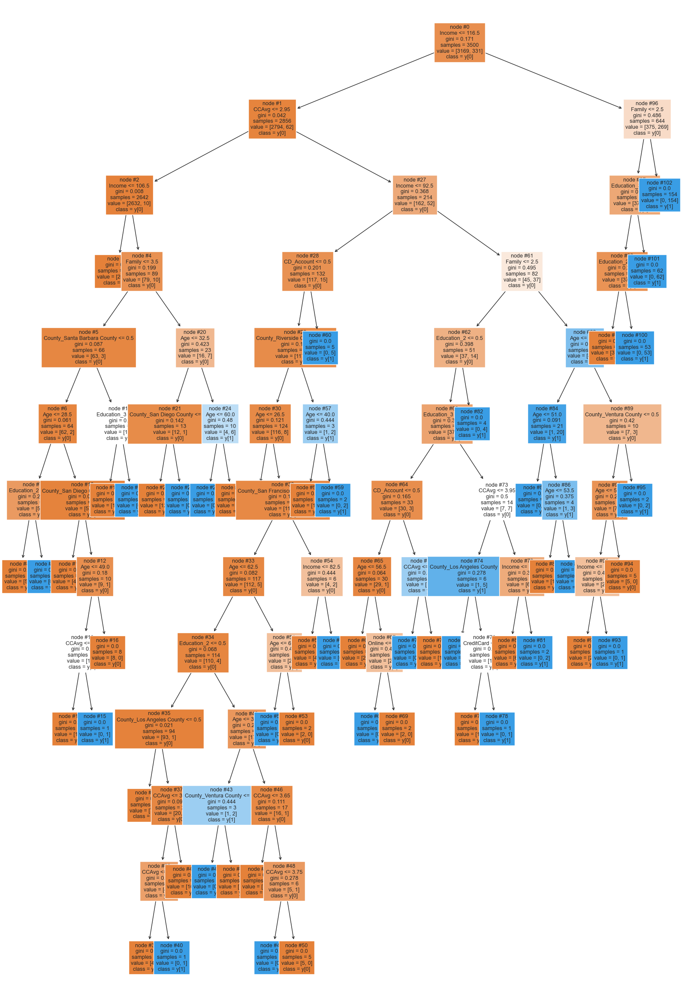

In [81]:
plt.figure(figsize=(20,30))
tree.plot_tree(dTree,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)


In [82]:
# Text report showing the rules of a decision tree -

print(tree.export_text(dTree,feature_names=feature_names,show_weights=True))

|--- Income <= 116.50
|   |--- CCAvg <= 2.95
|   |   |--- Income <= 106.50
|   |   |   |--- weights: [2553.00, 0.00] class: 0
|   |   |--- Income >  106.50
|   |   |   |--- Family <= 3.50
|   |   |   |   |--- County_Santa Barbara County <= 0.50
|   |   |   |   |   |--- Age <= 28.50
|   |   |   |   |   |   |--- Education_2 <= 0.50
|   |   |   |   |   |   |   |--- weights: [5.00, 0.00] class: 0
|   |   |   |   |   |   |--- Education_2 >  0.50
|   |   |   |   |   |   |   |--- weights: [0.00, 1.00] class: 1
|   |   |   |   |   |--- Age >  28.50
|   |   |   |   |   |   |--- County_San Diego County <= 0.50
|   |   |   |   |   |   |   |--- weights: [48.00, 0.00] class: 0
|   |   |   |   |   |   |--- County_San Diego County >  0.50
|   |   |   |   |   |   |   |--- Age <= 49.00
|   |   |   |   |   |   |   |   |--- CCAvg <= 1.40
|   |   |   |   |   |   |   |   |   |--- weights: [1.00, 0.00] class: 0
|   |   |   |   |   |   |   |   |--- CCAvg >  1.40
|   |   |   |   |   |   |   |   |   |--- weigh

In [83]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(dTree.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                                    Imp
Income                         0.309494
Family                         0.246862
Education_2                    0.166418
Education_3                    0.145875
CCAvg                          0.051900
Age                            0.040806
CD_Account                     0.017273
County_Ventura County          0.006312
County_Riverside County        0.003544
County_San Diego County        0.003356
Online                         0.002224
CreditCard                     0.001668
County_San Francisco County    0.001608
County_Santa Barbara County    0.001422
County_Los Angeles County      0.001236
County_Trinity County          0.000000
County_Stanislaus County       0.000000
County_Sonoma County           0.000000
County_Solano County           0.000000
County_Tuolumne County         0.000000
County_Siskiyou County         0.000000
County_Shasta County           0.000000
County_Santa Cruz County       0.000000
County_Santa Clara County      0.000000


Text(0.5, 0, 'Relative Importance')

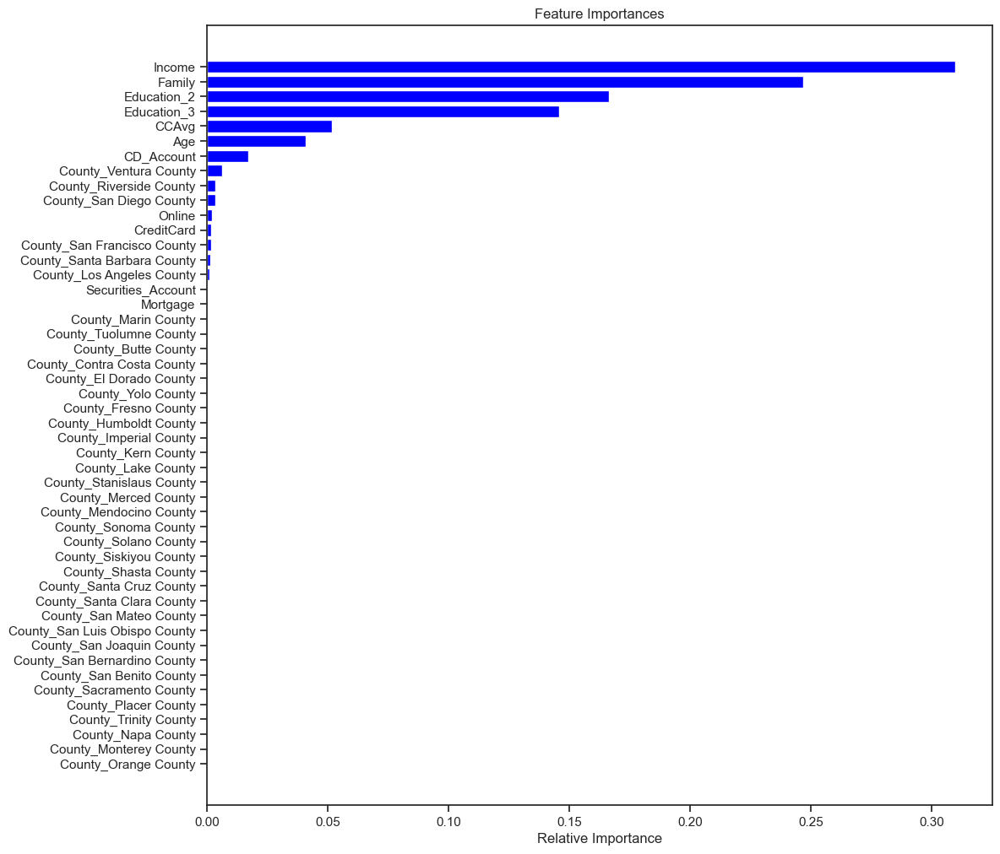

In [84]:

importances = dTree.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.rcParams['axes.facecolor'] = 'white'
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='blue', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')




# Observation: 
    1. Education 
    2. Income
    3. Family 
    4. CCAvg
    5. Age 
    these are the most importan features which will help determine the model performance and also loan taking 

# Reducing over fitting

In [85]:
dTree1 = DecisionTreeClassifier(criterion = 'gini',max_depth=10,random_state=1)
dTree1.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=10, random_state=1)

# Confusion Matrix - decision tree with depth restricted to 3

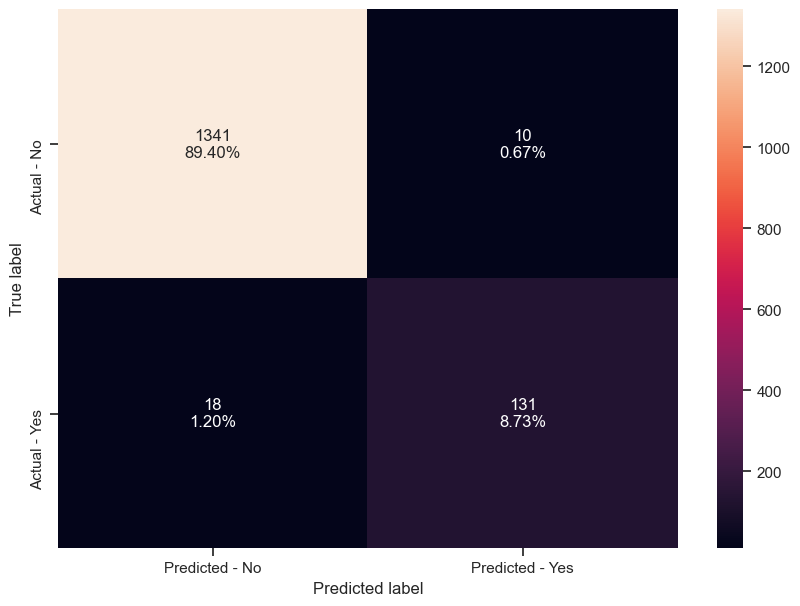

In [86]:
make_confusion_matrix(dTree1, y_test)

In [87]:
# Accuracy on train and test
print("Accuracy on training set : ",dTree1.score(X_train, y_train))
print("Accuracy on test set : ",dTree1.score(X_test, y_test))
# Recall on train and test
get_recall_score(dTree1)

Accuracy on training set :  0.9991428571428571
Accuracy on test set :  0.9813333333333333
Recall on training set :  0.9939577039274925
Recall on test set :  0.8791946308724832


# Visualizing the Decision Tree

[Text(791.298874407583, 735.0, 'node #0\nIncome <= 116.5\ngini = 0.171\nsamples = 3500\nvalue = [3169, 331]\nclass = y[0]'),
 Text(464.17357819905214, 665.0, 'node #1\nCCAvg <= 2.95\ngini = 0.042\nsamples = 2856\nvalue = [2794, 62]\nclass = y[0]'),
 Text(214.8696682464455, 595.0, 'node #2\nIncome <= 106.5\ngini = 0.008\nsamples = 2642\nvalue = [2632, 10]\nclass = y[0]'),
 Text(192.83175355450237, 525.0, 'node #3\ngini = 0.0\nsamples = 2553\nvalue = [2553, 0]\nclass = y[0]'),
 Text(236.90758293838863, 525.0, 'node #4\nFamily <= 3.5\ngini = 0.199\nsamples = 89\nvalue = [79, 10]\nclass = y[0]'),
 Text(143.24644549763033, 455.0, 'node #5\nCounty_Santa Barbara County <= 0.5\ngini = 0.087\nsamples = 66\nvalue = [63, 3]\nclass = y[0]'),
 Text(88.15165876777252, 385.0, 'node #6\nAge <= 28.5\ngini = 0.061\nsamples = 64\nvalue = [62, 2]\nclass = y[0]'),
 Text(44.07582938388626, 315.0, 'node #7\nEducation_2 <= 0.5\ngini = 0.278\nsamples = 6\nvalue = [5, 1]\nclass = y[0]'),
 Text(22.03791469194313

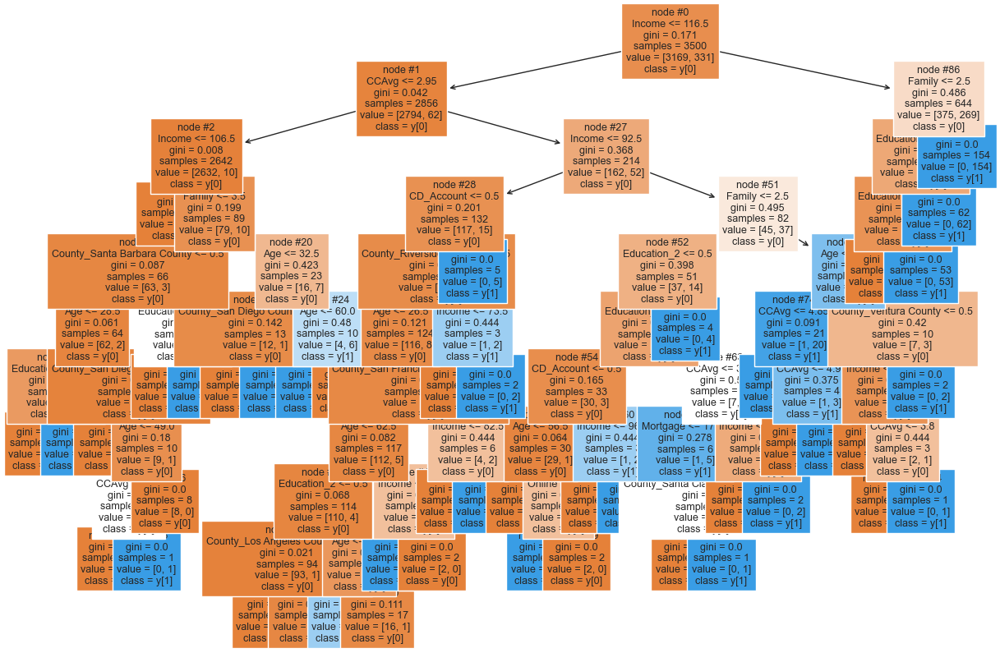

In [88]:
plt.figure(figsize=(15,10))

tree.plot_tree(dTree1,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)


In [89]:
# Text report showing the rules of a decision tree -

print(tree.export_text(dTree1,feature_names=feature_names,show_weights=True))

|--- Income <= 116.50
|   |--- CCAvg <= 2.95
|   |   |--- Income <= 106.50
|   |   |   |--- weights: [2553.00, 0.00] class: 0
|   |   |--- Income >  106.50
|   |   |   |--- Family <= 3.50
|   |   |   |   |--- County_Santa Barbara County <= 0.50
|   |   |   |   |   |--- Age <= 28.50
|   |   |   |   |   |   |--- Education_2 <= 0.50
|   |   |   |   |   |   |   |--- weights: [5.00, 0.00] class: 0
|   |   |   |   |   |   |--- Education_2 >  0.50
|   |   |   |   |   |   |   |--- weights: [0.00, 1.00] class: 1
|   |   |   |   |   |--- Age >  28.50
|   |   |   |   |   |   |--- County_San Diego County <= 0.50
|   |   |   |   |   |   |   |--- weights: [48.00, 0.00] class: 0
|   |   |   |   |   |   |--- County_San Diego County >  0.50
|   |   |   |   |   |   |   |--- Age <= 49.00
|   |   |   |   |   |   |   |   |--- CCAvg <= 1.40
|   |   |   |   |   |   |   |   |   |--- weights: [1.00, 0.00] class: 0
|   |   |   |   |   |   |   |   |--- CCAvg >  1.40
|   |   |   |   |   |   |   |   |   |--- weigh

In [90]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(dTree1.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                                    Imp
Income                         0.317350
Family                         0.248989
Education_2                    0.167852
Education_3                    0.147132
CCAvg                          0.049180
Age                            0.032764
CD_Account                     0.017422
County_Ventura County          0.004123
County_Riverside County        0.003574
County_San Diego County        0.003385
Online                         0.002244
County_Santa Clara County      0.001683
County_San Francisco County    0.001622
County_Santa Barbara County    0.001434
Mortgage                       0.001122
County_Los Angeles County      0.000124
County_San Joaquin County      0.000000
County_San Luis Obispo County  0.000000
County_San Mateo County        0.000000
County_Tuolumne County         0.000000
County_Trinity County          0.000000
County_Shasta County           0.000000
County_Yolo County             0.000000
County_Siskiyou County         0.000000


# Mortgage does not show importance in giving a loan but it does in paying it back. 

Text(0.5, 0, 'Relative Importance')

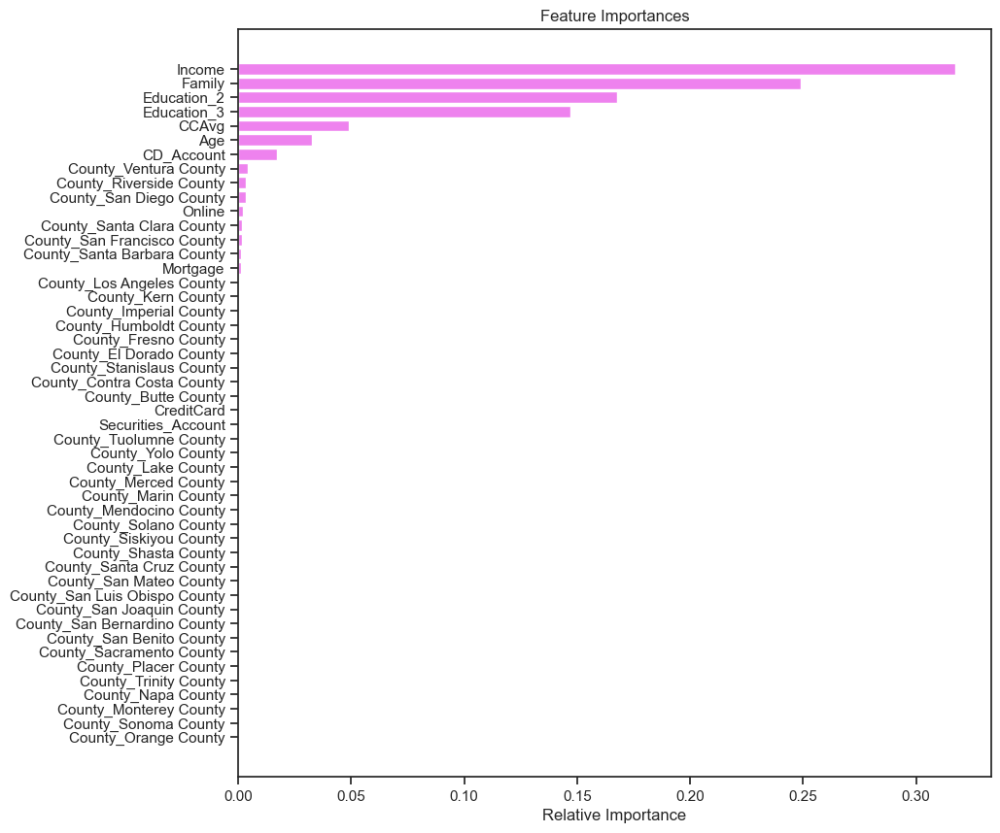

In [91]:
importances = dTree1.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(10,10))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')


# Using GridSearch for Hyperparameter tuning of our tree model

## Hyperparameter  uses mostly experiment ways to see the capability  that helps improve 
## Grid search is a tuning technique that attempts to compute preferred variables for this

In [92]:
from sklearn.model_selection import GridSearchCV

In [93]:
# Choose the type of classifier. 
estimator = DecisionTreeClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {'max_depth': [5,10,15, None], 
             
               "criterion": ["entropy", "gini"],
               "splitter": ["best", "random"],
               "min_impurity_decrease": [0.00001, 0.0001, 0.01],
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(estimator, parameters, scoring=acc_scorer,cv=3)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
estimator.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=10,
                       min_impurity_decrease=1e-05, random_state=1)

# Confusion Matrix - decision tree with tuned hyperparameters

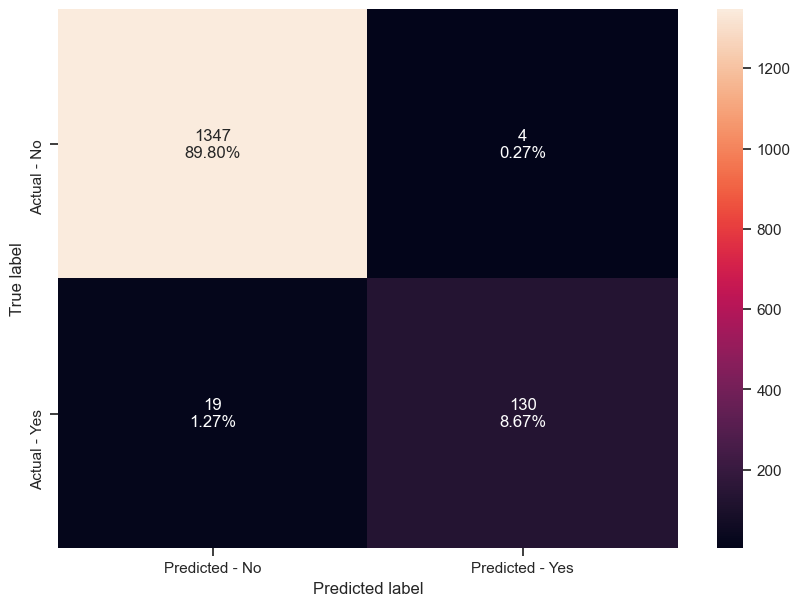

In [94]:
make_confusion_matrix(estimator,y_test)

# Observation
##  this shows that it is a double edged sword, as not all are impacted the same. 

In [95]:
# Accuracy on train and test
print("Accuracy on training set : ",estimator.score(X_train, y_train))
print("Accuracy on test set : ",estimator.score(X_test, y_test))
# Recall on train and test
get_recall_score(estimator)

Accuracy on training set :  0.9974285714285714
Accuracy on test set :  0.9846666666666667
Recall on training set :  0.972809667673716
Recall on test set :  0.87248322147651


# Observation
##  Accuracy improved , Recall also improved in absolute numbers

# as expected recall has improved on training and test

# Visualizing the Decision Tree

[Text(462.0192307692308, 735.0, 'node #0\nIncome <= 98.5\nentropy = 0.452\nsamples = 3500\nvalue = [3169, 331]\nclass = y[0]'),
 Text(178.84615384615384, 665.0, 'node #1\nCCAvg <= 2.95\nentropy = 0.07\nsamples = 2640\nvalue = [2618, 22]\nclass = y[0]'),
 Text(149.03846153846155, 595.0, 'node #2\nentropy = 0.0\nsamples = 2494\nvalue = [2494, 0]\nclass = y[0]'),
 Text(208.65384615384613, 595.0, 'node #3\nCD_Account <= 0.5\nentropy = 0.612\nsamples = 146\nvalue = [124, 22]\nclass = y[0]'),
 Text(149.03846153846155, 525.0, 'node #4\nCCAvg <= 3.95\nentropy = 0.476\nsamples = 137\nvalue = [123, 14]\nclass = y[0]'),
 Text(119.23076923076923, 455.0, 'node #5\nCCAvg <= 3.85\nentropy = 0.615\nsamples = 92\nvalue = [78, 14]\nclass = y[0]'),
 Text(89.42307692307692, 385.0, 'node #6\nMortgage <= 102.5\nentropy = 0.54\nsamples = 89\nvalue = [78, 11]\nclass = y[0]'),
 Text(59.61538461538461, 315.0, 'node #7\nCCAvg <= 3.05\nentropy = 0.644\nsamples = 67\nvalue = [56, 11]\nclass = y[0]'),
 Text(29.8076

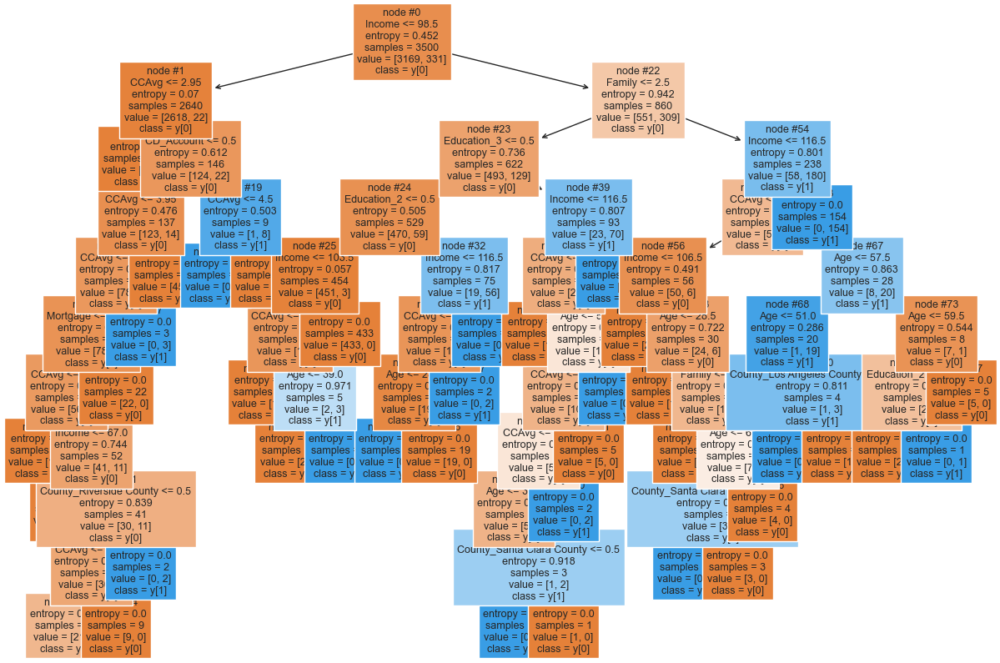

In [96]:
plt.figure(figsize=(15,10))

tree.plot_tree(estimator,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)


In [97]:
# Text report showing the rules of a decision tree -

print(tree.export_text(estimator,feature_names=feature_names,show_weights=True))

|--- Income <= 98.50
|   |--- CCAvg <= 2.95
|   |   |--- weights: [2494.00, 0.00] class: 0
|   |--- CCAvg >  2.95
|   |   |--- CD_Account <= 0.50
|   |   |   |--- CCAvg <= 3.95
|   |   |   |   |--- CCAvg <= 3.85
|   |   |   |   |   |--- Mortgage <= 102.50
|   |   |   |   |   |   |--- CCAvg <= 3.05
|   |   |   |   |   |   |   |--- weights: [15.00, 0.00] class: 0
|   |   |   |   |   |   |--- CCAvg >  3.05
|   |   |   |   |   |   |   |--- Income <= 67.00
|   |   |   |   |   |   |   |   |--- weights: [11.00, 0.00] class: 0
|   |   |   |   |   |   |   |--- Income >  67.00
|   |   |   |   |   |   |   |   |--- County_Riverside County <= 0.50
|   |   |   |   |   |   |   |   |   |--- CCAvg <= 3.75
|   |   |   |   |   |   |   |   |   |   |--- weights: [21.00, 9.00] class: 0
|   |   |   |   |   |   |   |   |   |--- CCAvg >  3.75
|   |   |   |   |   |   |   |   |   |   |--- weights: [9.00, 0.00] class: 0
|   |   |   |   |   |   |   |   |--- County_Riverside County >  0.50
|   |   |   |   |   |   |

In [98]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the 'criterion' brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(estimator.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

#Here we will see that importance of features has increased

                                    Imp
Income                         0.530396
Education_2                    0.117355
CCAvg                          0.113201
Family                         0.106908
Education_3                    0.074742
Age                            0.029926
CD_Account                     0.012586
County_Santa Clara County      0.007091
Mortgage                       0.003129
County_Riverside County        0.002577
County_Los Angeles County      0.002088
County_Tuolumne County         0.000000
County_Ventura County          0.000000
County_San Francisco County    0.000000
County_Yolo County             0.000000
County_San Joaquin County      0.000000
County_San Luis Obispo County  0.000000
County_San Mateo County        0.000000
County_Santa Barbara County    0.000000
County_Santa Cruz County       0.000000
County_Trinity County          0.000000
County_Shasta County           0.000000
County_San Bernardino County   0.000000
County_Siskiyou County         0.000000


Text(0.5, 0, 'Relative Importance')

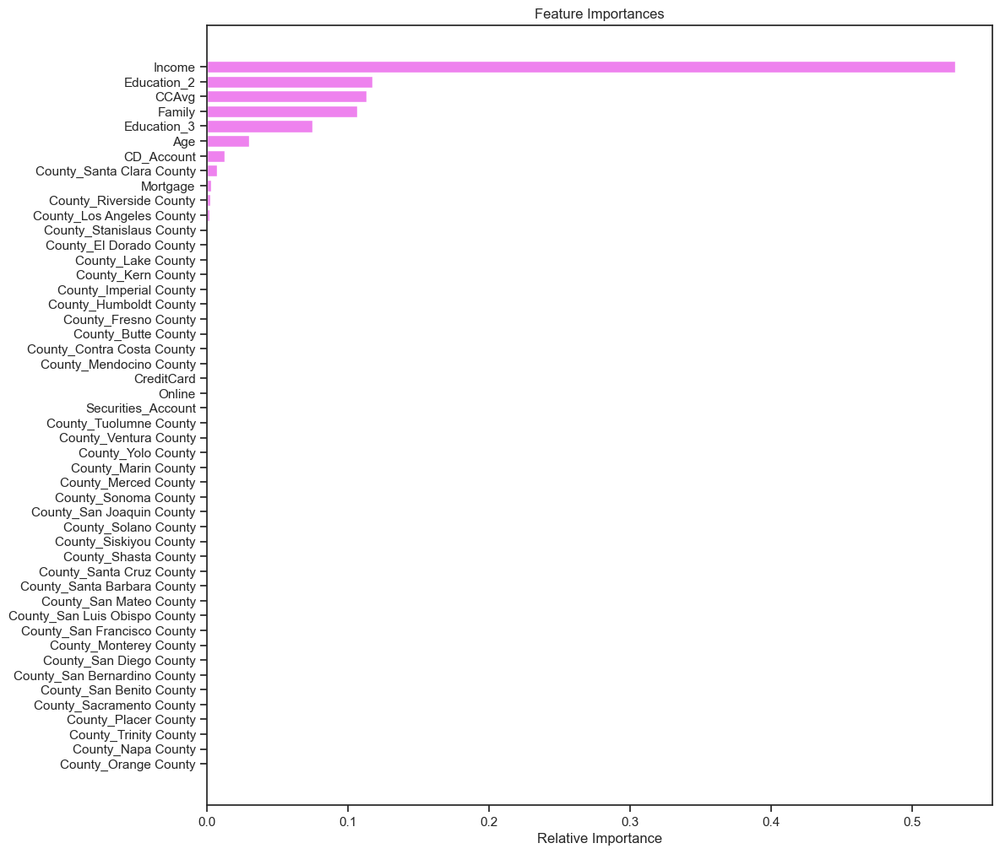

In [99]:
importances = estimator.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')


# Cost Complexity Pruning¶

# here we pre define min_samples_leaf and max_depth and work with the tree
#  Thus helping us perform better and faster operations

Total impurity of leaves vs effective alphas of pruned tree
Minimal cost complexity pruning recursively finds the node with the "weakest link". The weakest link is characterized by an effective alpha, where the nodes with the smallest effective alpha are pruned first. To get an idea of what values of ccp_alpha could be appropriate, scikit-learn provides DecisionTreeClassifier.cost_complexity_pruning_path that returns the effective alphas and the corresponding total leaf impurities at each step of the pruning process. As alpha increases, more of the tree is pruned, which increases the total impurity of its leaves.    # 

In [100]:
clf = DecisionTreeClassifier(random_state=1)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [101]:
pd.DataFrame(path)

,ccp_alphas,impurities
0,0.000000,0.000000
1,0.000187,0.000562
2,0.000188,0.001127
3,0.000238,0.001603
4,0.000250,0.002103
5,0.000269,0.003178
6,0.000269,0.003716
7,0.000272,0.004260
8,0.000276,0.004812
9,0.000326,0.006444


Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

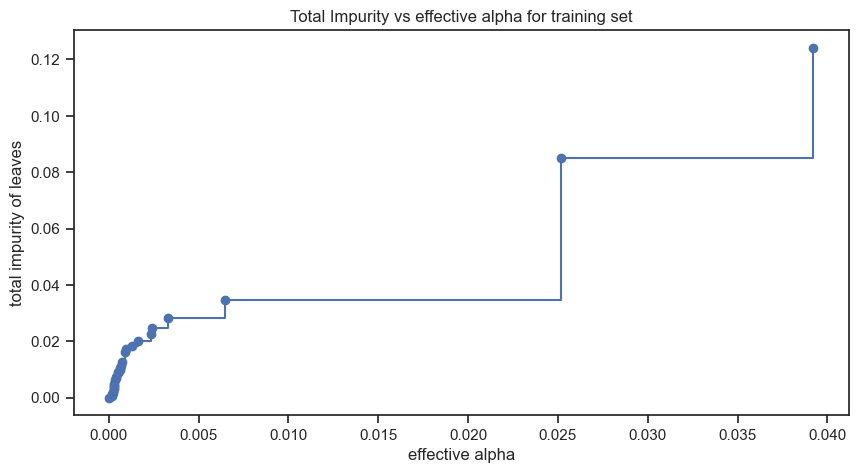

In [102]:
fig, ax = plt.subplots(figsize=(10,5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

 # Next, we train a decision tree using the effective alphas. The last value in ccp_alphas is the alpha value that prunes the whole tree, leaving the tree, clfs[-1], with one node

In [103]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=1, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.04708834100596766


# Since this is the only one node let us not consider it or remove it 


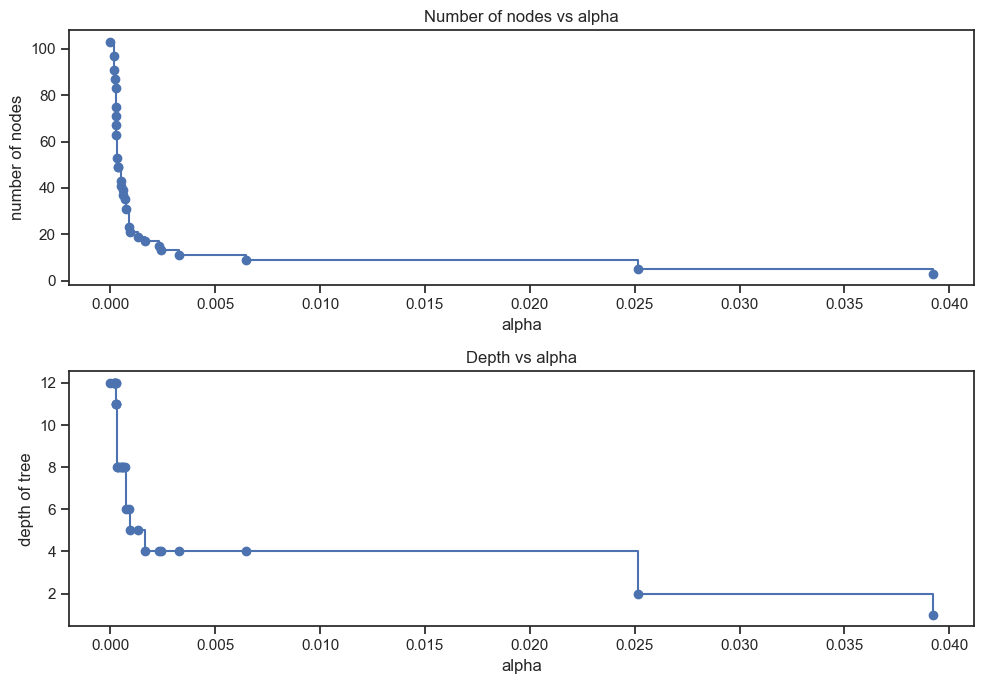

In [104]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1,figsize=(10,7))
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

# Accuracy vs alpha for training and testing sets

In [105]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

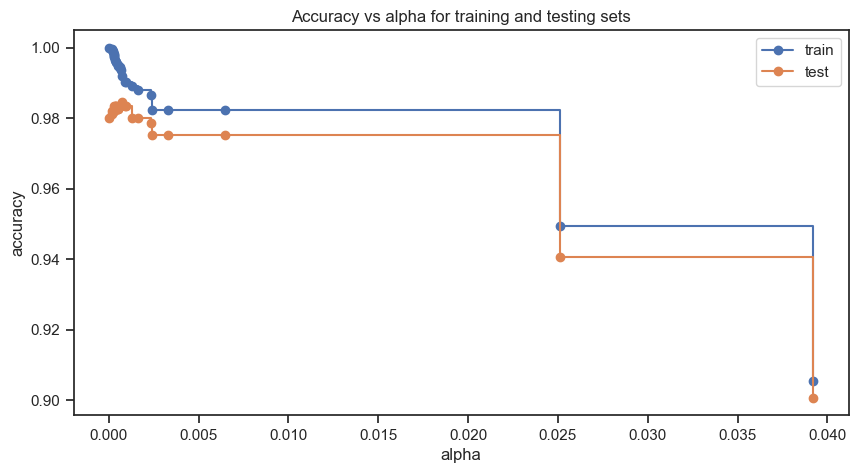

In [106]:
fig, ax = plt.subplots(figsize=(10,5))
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()


In [107]:
index_best_model = np.argmax(test_scores)
best_model = clfs[index_best_model]
print(best_model)
print('Training accuracy of best model: ',best_model.score(X_train, y_train))
print('Test accuracy of best model: ',best_model.score(X_test, y_test))

DecisionTreeClassifier(ccp_alpha=0.0007619047619047619, random_state=1)
Training accuracy of best model:  0.992
Test accuracy of best model:  0.9846666666666667


# let us also see whats the recall value here 

In [108]:
recall_train=[]
for clf in clfs:
    pred_train3=clf.predict(X_train)
    values_train=metrics.recall_score(y_train,pred_train3)
    recall_train.append(values_train)

In [109]:
recall_test=[]
for clf in clfs:
    pred_test3=clf.predict(X_test)
    values_test=metrics.recall_score(y_test,pred_test3)
    recall_test.append(values_test)

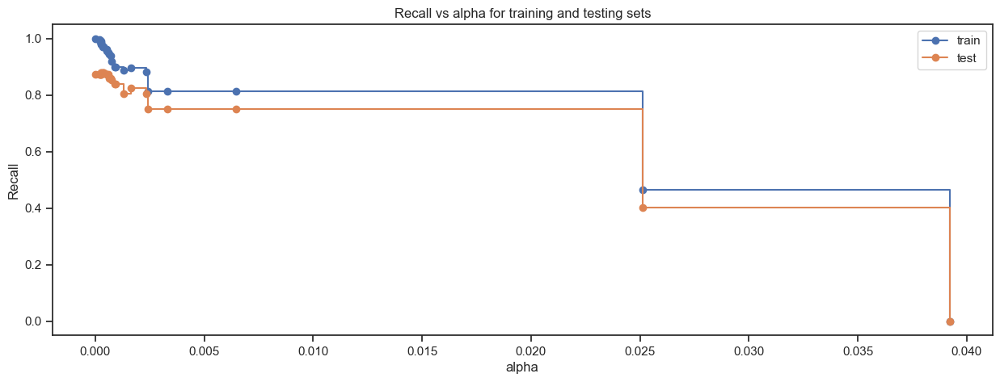

In [110]:
fig, ax = plt.subplots(figsize=(15,5))
ax.set_xlabel("alpha")
ax.set_ylabel("Recall")
ax.set_title("Recall vs alpha for training and testing sets")
ax.plot(ccp_alphas, recall_train, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, recall_test, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()


In [111]:
# creating the model where we get highest train and test recall
index_best_model = np.argmax(recall_test)
best_model = clfs[index_best_model]
print(best_model)

DecisionTreeClassifier(ccp_alpha=0.00027210884353741507, random_state=1)


# Confusion Matrix - post-pruned decision tree

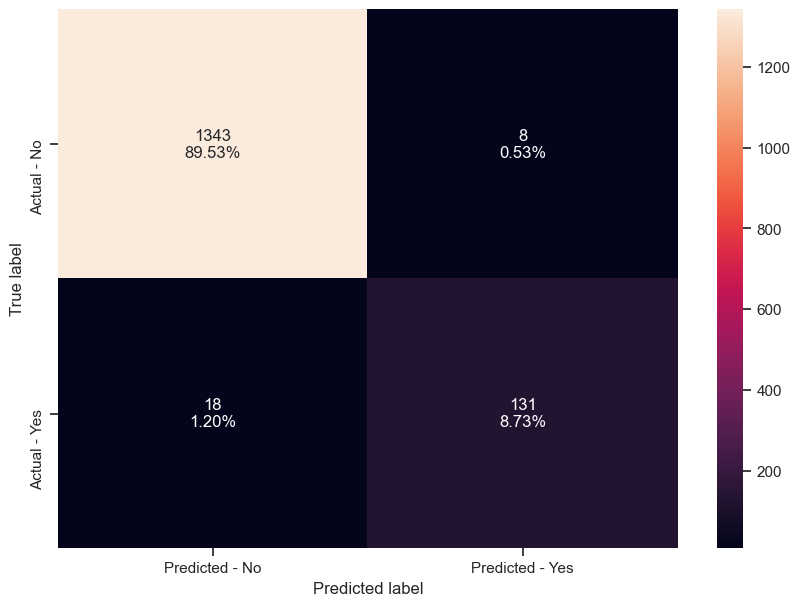

In [112]:
make_confusion_matrix(best_model,y_test)

In [113]:
# Recall on train and test
get_recall_score(best_model)

Recall on training set :  0.9818731117824774
Recall on test set :  0.8791946308724832


# hence we not have a better recall after post prunning 

# visualize the tree view here 

[Text(823.4375, 1106.875, 'node #0\nIncome <= 116.5\ngini = 0.171\nsamples = 3500\nvalue = [3169, 331]\nclass = y[0]'),
 Text(406.875, 1010.625, 'node #1\nCCAvg <= 2.95\ngini = 0.042\nsamples = 2856\nvalue = [2794, 62]\nclass = y[0]'),
 Text(77.5, 914.375, 'node #2\nIncome <= 106.5\ngini = 0.008\nsamples = 2642\nvalue = [2632, 10]\nclass = y[0]'),
 Text(38.75, 818.125, 'node #3\ngini = 0.0\nsamples = 2553\nvalue = [2553, 0]\nclass = y[0]'),
 Text(116.25, 818.125, 'node #4\nFamily <= 3.5\ngini = 0.199\nsamples = 89\nvalue = [79, 10]\nclass = y[0]'),
 Text(77.5, 721.875, 'node #5\ngini = 0.087\nsamples = 66\nvalue = [63, 3]\nclass = y[0]'),
 Text(155.0, 721.875, 'node #6\nAge <= 32.5\ngini = 0.423\nsamples = 23\nvalue = [16, 7]\nclass = y[0]'),
 Text(77.5, 625.625, 'node #7\nCounty_San Diego County <= 0.5\ngini = 0.142\nsamples = 13\nvalue = [12, 1]\nclass = y[0]'),
 Text(38.75, 529.375, 'node #8\ngini = 0.0\nsamples = 12\nvalue = [12, 0]\nclass = y[0]'),
 Text(116.25, 529.375, 'node #9\

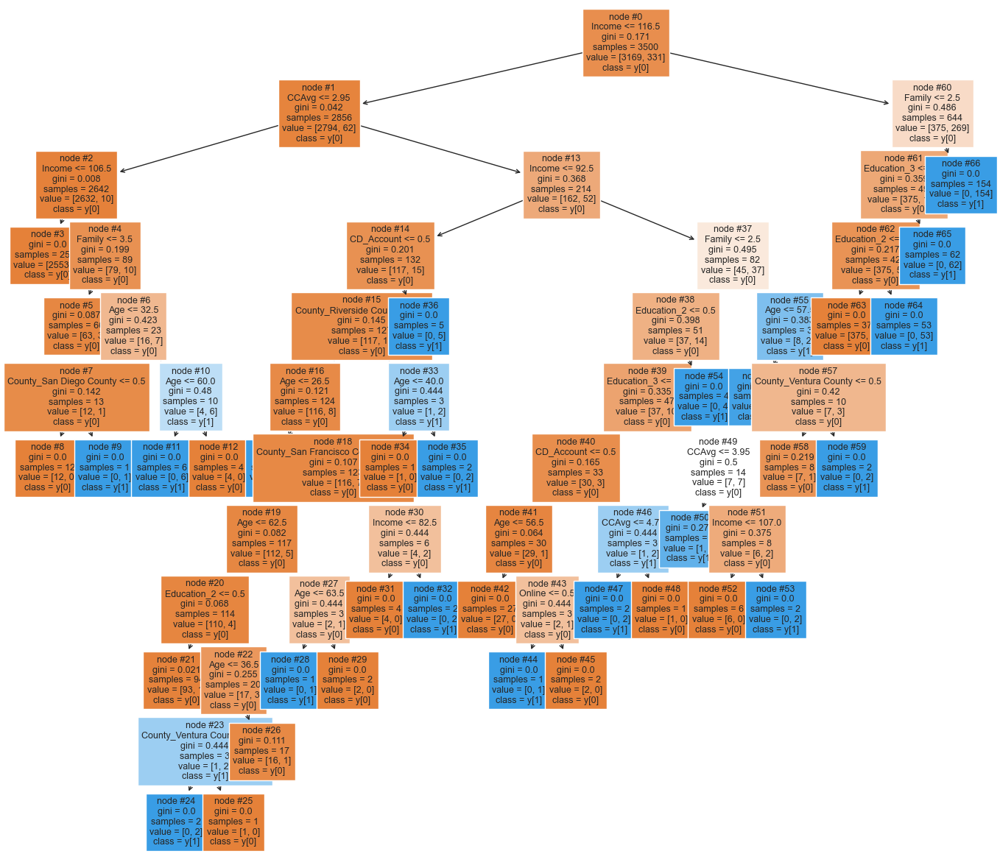

In [114]:
plt.figure(figsize=(17,15))

tree.plot_tree(best_model,feature_names=feature_names,filled=True,fontsize=9,node_ids=True,class_names=True)


In [115]:
# Text report showing the rules of a decision tree -

print(tree.export_text(best_model,feature_names=feature_names,show_weights=True))

|--- Income <= 116.50
|   |--- CCAvg <= 2.95
|   |   |--- Income <= 106.50
|   |   |   |--- weights: [2553.00, 0.00] class: 0
|   |   |--- Income >  106.50
|   |   |   |--- Family <= 3.50
|   |   |   |   |--- weights: [63.00, 3.00] class: 0
|   |   |   |--- Family >  3.50
|   |   |   |   |--- Age <= 32.50
|   |   |   |   |   |--- County_San Diego County <= 0.50
|   |   |   |   |   |   |--- weights: [12.00, 0.00] class: 0
|   |   |   |   |   |--- County_San Diego County >  0.50
|   |   |   |   |   |   |--- weights: [0.00, 1.00] class: 1
|   |   |   |   |--- Age >  32.50
|   |   |   |   |   |--- Age <= 60.00
|   |   |   |   |   |   |--- weights: [0.00, 6.00] class: 1
|   |   |   |   |   |--- Age >  60.00
|   |   |   |   |   |   |--- weights: [4.00, 0.00] class: 0
|   |--- CCAvg >  2.95
|   |   |--- Income <= 92.50
|   |   |   |--- CD_Account <= 0.50
|   |   |   |   |--- County_Riverside County <= 0.50
|   |   |   |   |   |--- Age <= 26.50
|   |   |   |   |   |   |--- weights: [0.00, 1.00

In [116]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the 'criterion' brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(best_model.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                                    Imp
Income                         0.315108
Family                         0.253159
Education_2                    0.167812
Education_3                    0.147886
CCAvg                          0.045034
Age                            0.036091
CD_Account                     0.017714
County_Ventura County          0.006473
County_Riverside County        0.003634
County_San Diego County        0.003159
Online                         0.002281
County_San Francisco County    0.001649
County_Tuolumne County         0.000000
County_Santa Barbara County    0.000000
Mortgage                       0.000000
County_Yolo County             0.000000
County_San Joaquin County      0.000000
County_San Luis Obispo County  0.000000
County_San Mateo County        0.000000
County_Santa Clara County      0.000000
County_Trinity County          0.000000
County_Santa Cruz County       0.000000
County_San Bernardino County   0.000000
County_Siskiyou County         0.000000


Text(0.5, 0, 'Relative Importance')

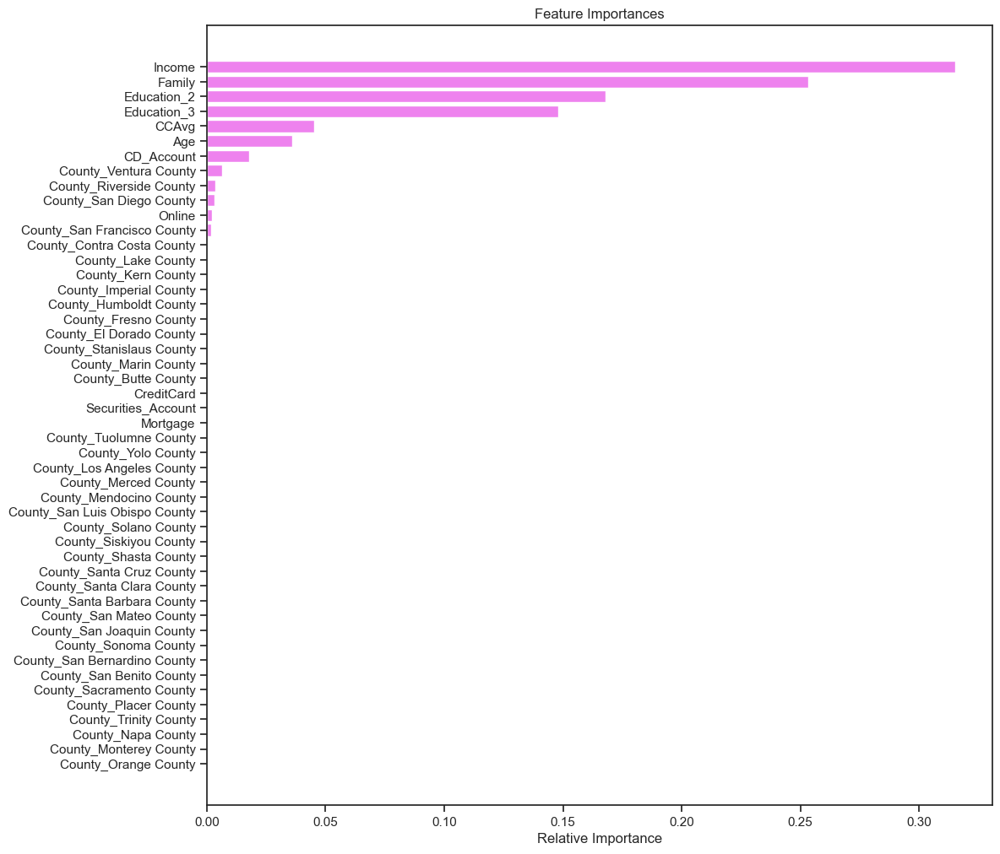

In [117]:
importances = best_model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')


In [118]:
# Recall on train and test
get_recall_score(best_model)

Recall on training set :  0.9818731117824774
Recall on test set :  0.8791946308724832


# Comparing all the decision tree models

In [119]:
comparison_frame = pd.DataFrame({'Model':['Initial decision tree model','Decision tree with restricted maximum depth',
					'Decision treee with hyperparameter tuning',
                                  'Decision tree with post-pruning'], 
				'Train_Recall':[1,0.92,0.97,1.0], 'Test_Recall':[0.98,0.85,0.87,0.91]}) 
comparison_frame

,Model,Train_Recall,Test_Recall
0,Initial decision tree model,1.00,0.98
1,Decision tree with restricted maximum depth,0.92,0.85
2,Decision treee with hyperparameter tuning,0.97,0.87
3,Decision tree with post-pruning,1.00,0.91


# observations
##  Logistic regression did not help in making better decission than decission tree.
##  we have best fitted model that could bring near  accurate with high recall and we can still futher try to tune it to make it over fit as well 
### Factors listed in obove observations are key features that determine if a customer would  need another loan
### caution is needed that the data does not consider the repayment. 
### we use  confisuion matrix to avoid false positive on a customer who can't repay the load
### Interest earned isl  less than pirincial. 
### with given standard input of 10 times income to debt ration, we can even further fine tune loan lending operations to customers who can potentially benefit form this 

# Target Segment are people with Higher income and no credit card 
# people with age > 50 and higher income, and mortage less than their income can be targeted. 
# people with  Age under 30, educaton  level 1 and income are also likely to take loan 